# statistical analysis of inference results

In [37]:
import sys
import os
current_dir = os.path.abspath('')
os.chdir(current_dir)
sys.path.append(os.path.join(current_dir,'..','code','BalancingControl'))

import two_stage_utils as tu
import inference as inf
import inference_utils as iu

In [38]:
import torch
import pyro

import os
from scipy.io import loadmat
import matplotlib.pylab as plt
import seaborn as sns
import pandas as pd
import glob
import pickle
import json
import gc

from scipy.stats import pearsonr
from numpy import eye, where, triu, zeros_like, ones_like
from statsmodels.stats.multitest import multipletests

### Folder and file settings

In [39]:
results_folder = "results"
inference_folder = os.path.join(results_folder, "inference")

mask_file_name = "mask.txt"
processed_data_folder = os.path.join("processed_data")
mask_file = os.path.join(processed_data_folder, mask_file_name)

processed_data_folder = os.path.join("processed_data")

full_data_fname = "full_data.csv"
full_data_file = os.path.join(processed_data_folder, full_data_fname)

full_data_df = pd.read_csv(full_data_file)

statistics_folder = os.path.join(results_folder, "statistics")

scores_file_name = "scores.csv"
scores_file = os.path.join(statistics_folder, scores_file_name)

n_agents = 188

### Experiment parameters

In [40]:
trials =  201#number of trials
T = 3 #number of time steps in each trial
nb = 4 # number of bandits, ie second level rewards
ns = 3+nb #number of states
no = ns #number of observations
na = 2 #number of actions
npi = na**(T-1) #number of policies
nr = 2 #number of rewards
never_reward = ns-nb # states that dont generate rewards

# prob for invalid answer (e.g. no reply). Same frequency as in the real data
# prob for invalid answer (e.g. no reply). Same frequency as in the real data
with open(mask_file, "rb") as f:
    all_mask = pickle.load(f)
# simulations will be done with the same missing actions as in the data.
exp_mask = torch.tensor(all_mask).permute((1,0))
p_valid = exp_mask.sum()/(exp_mask.shape[0]*exp_mask.shape[1])
print(p_valid)

# make global parameter dict:
global_experiment_parameters = {"trials": trials, "T": T, "nb": nb, "ns": ns, "no": no, "na": na, "npi": npi, "nr": nr, "never_reward": never_reward, "p_invalid": p_valid, "mask": exp_mask}

tensor(0.9766)


/tmp/ipykernel_8583/1548601007.py:16: DeprecationWarning: In future, it will be an error for 'np.bool' scalars to be interpreted as an index
  exp_mask = torch.tensor(all_mask).permute((1,0))


In [41]:
#generating probability of observations in each state / unity matrix
A = torch.eye(no)


#state transition generative probability (matrix)
B = torch.zeros((ns, ns, na))
b1 = 0.7
nb1 = 1.-b1
b2 = 0.7
nb2 = 1.-b2

B[:,:,0] = torch.tensor([[  0,  0,  0,  0,  0,  0,  0,],
                         [ b1,  0,  0,  0,  0,  0,  0,],
                         [nb1,  0,  0,  0,  0,  0,  0,],
                         [  0,  1,  0,  1,  0,  0,  0,],
                         [  0,  0,  1,  0,  1,  0,  0,],
                         [  0,  0,  0,  0,  0,  1,  0,],
                         [  0,  0,  0,  0,  0,  0,  1,],])

B[:,:,1] = torch.tensor([[  0,  0,  0,  0,  0,  0,  0,],
                         [nb2,  0,  0,  0,  0,  0,  0,],
                         [ b2,  0,  0,  0,  0,  0,  0,],
                         [  0,  0,  0,  1,  0,  0,  0,],
                         [  0,  0,  0,  0,  1,  0,  0,],
                         [  0,  1,  0,  0,  0,  1,  0,],
                         [  0,  0,  1,  0,  0,  0,  1,],])

# add to parameter dict
global_experiment_parameters["A"] = A
global_experiment_parameters["B"] = B

### Convenience functions

In [42]:
def convert_data_for_agent(full_data_df):

    mask = full_data_df.loc[(full_data_df["step_index"]==1)]
    mask_formatted = torch.stack([torch.from_numpy(mask.loc[mask["subject"]==i]["mask"].to_numpy()) for i in range(n_agents)])

    actions1 = full_data_df.loc[(full_data_df["step_index"]==1)]
    actions1_formatted = torch.stack([torch.from_numpy(actions1.loc[actions1["subject"]==i]["first_stage_actions"].to_numpy()) for i in range(n_agents)])

    actions2 = full_data_df.loc[(full_data_df["step_index"]==2)]
    actions2_formatted = torch.stack([torch.from_numpy(actions2.loc[actions2["subject"]==i]["second_stage_actions"].to_numpy()) for i in range(n_agents)])

    print("possible actions1", torch.unique(actions1_formatted[mask_formatted]))
    print("possible actions2", torch.unique(actions2_formatted[mask_formatted]))

    # write minus one into invalid regions (currently returns integer overflow below when converted to int)
    actions1_formatted = torch.where(mask_formatted, actions1_formatted, -1)
    actions2_formatted = torch.where(mask_formatted, actions2_formatted, -1)

    actions = torch.stack([actions1_formatted, actions2_formatted], dim=-1).permute((1,2,0))
    #print(actions.permute((0,2,1))[mask_formatted])
    # agent counts from zero:
    actions = actions-1.

    states1 = full_data_df.loc[(full_data_df["step_index"]==1)]
    # agent counts from zero, hence -1 at the end:
    states1_formatted = torch.stack([torch.from_numpy(states1.loc[states1["subject"]==i]["first_stage_states"].to_numpy()) for i in range(n_agents)]) - 1
     
    states2 = full_data_df.loc[(full_data_df["step_index"]==2)]
    # agent counts from zero, hence -1 at the end:
    states2_formatted = torch.stack([torch.from_numpy(states2.loc[states2["subject"]==i]["second_stage_states"].to_numpy()) for i in range(n_agents)]) - 1

    # write minus one into invalid regions (currently returns integer overflow below when converted to int)
    states1_formatted = torch.where(mask_formatted, states1_formatted, -1)
    states2_formatted = torch.where(mask_formatted, states2_formatted, -1)
    # create third time step states:
    states3_formatted = states2_formatted+2 + (actions2_formatted-1)*2
    states3_formatted = torch.where(mask_formatted, states3_formatted, -1)


    print("possible states1", torch.unique(states1_formatted[mask_formatted]))
    print("possible states2", torch.unique(states2_formatted[mask_formatted]))
    print("possible states3", torch.unique(states3_formatted[mask_formatted]))

    states = torch.stack([states1_formatted, states2_formatted, states3_formatted], dim=-1).permute((1,2,0))

    # agent views r=2 as "no reward", may instead give negative reward as in Otto et al:
    rewards1_formatted = torch.zeros_like(states1_formatted) #+ 2

    rewards2_formatted = rewards1_formatted

    # create third time step rewards = second stage rewards:
    rewards3 = full_data_df.loc[(full_data_df["step_index"]==2)]
    rewards3_formatted = torch.stack([torch.from_numpy(rewards3.loc[rewards3["subject"]==i]["second_stage_rewards"].to_numpy()) for i in range(n_agents)])

    print("possible rewards1", torch.unique(rewards1_formatted[mask_formatted]))
    print("possible rewards2", torch.unique(rewards2_formatted[mask_formatted]))
    print("possible rewards3", torch.unique(rewards3_formatted[mask_formatted]))

    # write minus one into invalid regions (currently returns integer overflow below when converted to int)
    rewards1_formatted = torch.where(mask_formatted, rewards1_formatted, 0)
    rewards2_formatted = torch.where(mask_formatted, rewards2_formatted, 0)
    rewards3_formatted = torch.where(mask_formatted, rewards3_formatted, 0)

    rewards = torch.stack([rewards1_formatted, rewards2_formatted, rewards3_formatted], dim=-1).permute((1,2,0))


    data_dict = {"observations": states.long(), "rewards": rewards.long(), "actions": actions.long(), "valid": mask_formatted.permute((1,0))}

    return data_dict

data = convert_data_for_agent(full_data_df)

print(data)

possible actions1 tensor([1., 2.], dtype=torch.float64)
possible actions2 tensor([1., 2.], dtype=torch.float64)
possible states1 tensor([0.], dtype=torch.float64)
possible states2 tensor([1., 2.], dtype=torch.float64)
possible states3 tensor([3., 4., 5., 6.], dtype=torch.float64)
possible rewards1 tensor([0.], dtype=torch.float64)
possible rewards2 tensor([0.], dtype=torch.float64)
possible rewards3 tensor([0., 1.], dtype=torch.float64)
{'observations': tensor([[[ 0,  0,  0,  ..., -1,  0, -1],
         [ 1,  1,  2,  ..., -1,  1, -1],
         [ 3,  3,  4,  ..., -1,  5, -1]],

        [[ 0,  0,  0,  ...,  0,  0,  0],
         [ 1,  1,  2,  ...,  1,  1,  2],
         [ 5,  3,  6,  ...,  3,  3,  4]],

        [[ 0,  0,  0,  ...,  0,  0,  0],
         [ 1,  1,  2,  ...,  2,  2,  1],
         [ 5,  3,  6,  ...,  6,  6,  3]],

        ...,

        [[ 0,  0,  0,  ...,  0,  0,  0],
         [ 1,  1,  2,  ...,  1,  2,  1],
         [ 3,  5,  4,  ...,  3,  6,  3]],

        [[ 0,  0, -1,  ..., 

In [43]:
def load_BCC_results(learn_rewards, learn_habit, learn_cached, base_dir, global_experiment_parameters, valid, fname_base, num_steps, data, param_names, use_h=False):    

    # set up agent
    bayes_agent = tu.set_up_Bayesian_inference_agent(n_agents, learn_rewards, learn_habit, learn_cached, base_dir, 
                                                    global_experiment_parameters, data["valid"], remove_old=False, 
                                                    use_h=use_h)

    print('analyzing '+str(n_agents)+' data sets')

    resample = False

    # set up inference
    inferrer = inf.GeneralGroupInference(bayes_agent, data)

    fname_str = fname_base + str(num_steps)+'_'+str(n_agents)+'agents'

    inferrer.load_parameters(os.path.join(base_dir, fname_str+"_parameter.save"))

    inferrer.load_elbo(os.path.join(base_dir, fname_str+"_elbo.save"))

    if resample:
        mean_df, sample_df, locs_sample_df = iu.sample_posterior(inferrer, param_names, fname_str, base_dir) 
    else:
        mean_df, sample_df, locs_sample_df = iu.load_samples(base_dir, fname_str) 

    return mean_df, sample_df, locs_sample_df

In [44]:
def load_MFMB_results(use_orig, learn_prior, use_p, restrict_alpha, max_dt, base_dir, global_experiment_parameters, valid, fname_base, num_steps, data, param_names):    

    # set up agent
    mfmb_agent = tu.set_up_mbmf_inference_agent(n_agents, learn_prior, use_orig, use_p, restrict_alpha, max_dt, 0, base_dir, global_experiment_parameters, valid, remove_old=False)

    print('analyzing '+str(n_agents)+' data sets')

    resample = False

    # set up inference
    inferrer = inf.GeneralGroupInference(mfmb_agent, data)

    fname_str = fname_base + str(num_steps)+'_'+str(n_agents)+'agents'

    inferrer.load_parameters(os.path.join(base_dir, fname_str+"_parameter.save"))

    inferrer.load_elbo(os.path.join(base_dir, fname_str+"_elbo.save"))

    if resample:
        mean_df, sample_df, locs_sample_df = iu.sample_posterior(inferrer, param_names, fname_str, base_dir) 
    else:
        mean_df, sample_df, locs_sample_df = iu.load_samples(base_dir, fname_str) 

    return mean_df, sample_df, locs_sample_df

### load behavioral outputs of participants: mf-/mb-scores

In [45]:
scores_df = pd.read_csv(scores_file)

### Load BCC4 planning+repetition results, and plot correlations between inferred parameters

BCC_4pars_plan_habit_weight_NO_context
BCC_4pars_plan_habit_weight_NO_context_inference_
4
analyzing 188 data sets


/home/sarah/python_venvs/TwoStageStrategies/lib/python3.13/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(inp

<Figure size 640x480 with 0 Axes>

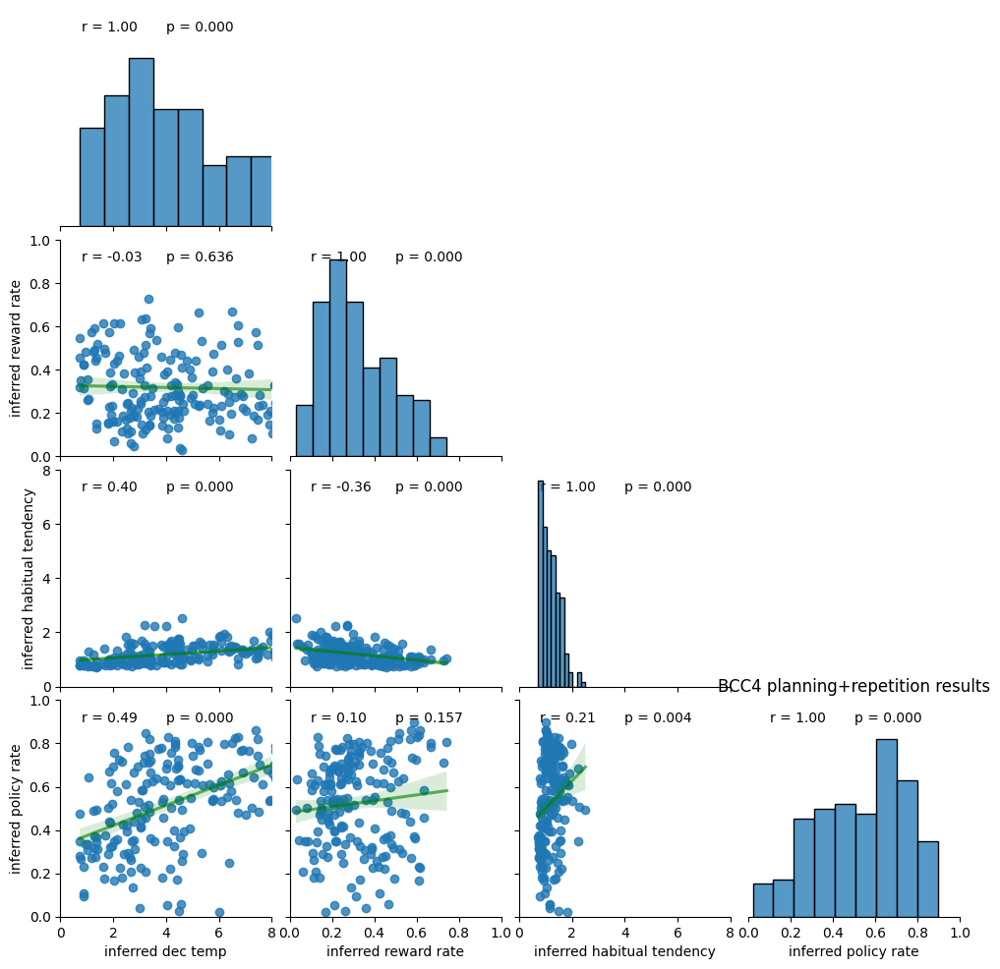

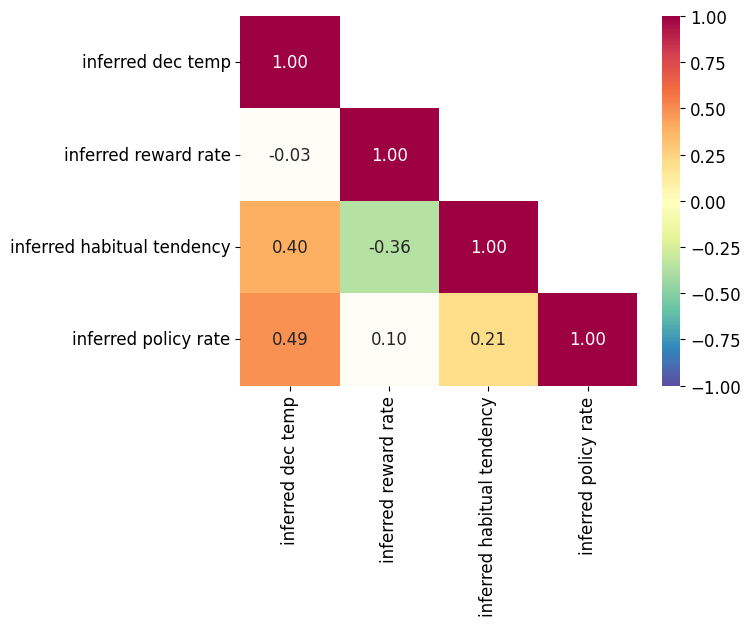

In [46]:
# BCC4 planning repetition analysis

learn_rewards = True
learn_habit = True
use_h = False
learn_cached = False

param_names = []
param_ranges = []

prefix = "BCC"
model_name = "Bayesian prior-based contextual control model"
n_pars = 0
agnt_str = ""

if learn_rewards:
    n_pars += 2
    param_names += ["dec temp", "reward rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_plan"

if learn_habit:
    # infer_h = True
    # infer_policy_rate = True 
    n_pars += 2
    agnt_str += "_habit"
    param_names += ["habitual tendency", "policy rate"]
    if use_h:
        agnt_str += "_h"
        param_ranges += [[0,1], [0,1]]
    else:
        agnt_str += "_weight"
        param_ranges += [[0,8], [0,1]]
# else:
#     infer_h = False
#     infer_policy_rate = False

if learn_cached:
    n_pars += 2
    param_names += ["cached weight", "cached rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_cached"

assert n_pars > 0, "please turn any part of the agent on, it cannot run without any learning or inference."

# choose max decision temperature for numerical stability
max_dt = 6

BCC4_p_r_param_names = param_names.copy()
BCC4_p_r_param_ranges = param_ranges.copy()

# prepare for saving results
# make base filename and folder string
agent_type = prefix+"_"+str(n_pars)+"pars"+agnt_str+"_NO_context"
print(agent_type)

# prepare for saving results
# make base filename and folder string
fname_base = agent_type+"_inference_"
print(fname_base)
# define folder where we want to save data
base_dir = os.path.join(inference_folder,fname_base[:-1])

# make directory if it doesnt exist
if fname_base[:-1] not in os.listdir(inference_folder):
    os.mkdir(base_dir)

num_steps = 600

BCC4_p_r_mean_df, BCC4_p_r_sample_df, BCC4_p_r_locs_df = load_BCC_results(learn_rewards, learn_habit, learn_cached, base_dir, global_experiment_parameters, exp_mask, fname_base, num_steps, data, param_names, use_h=False)

# param_plot_ranges = [[-0.25,1.25], [-0.25,1.25], [0,10]]

plt.figure()
vars_of_interest = ["inferred "+name for name in param_names]
f = sns.pairplot(data=BCC4_p_r_mean_df, kind='reg', diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=vars_of_interest, y_vars=vars_of_interest)
f.map(tu.annot_corrfunc)
for p, p_range in enumerate(param_ranges):
    f.axes[n_pars-1,p].set_xlim(p_range)
    f.axes[p,0].set_ylim(p_range)
plt.title("BCC4 planning+repetition results")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()

iu.plot_correlations(BCC4_p_r_mean_df, vars_of_interest, vars_of_interest)


### BCC4 planning+repetition results: plot correlations with behavioral outputs: mf-/mb-scores

['inferred dec temp BCC4_p_r', 'inferred reward rate BCC4_p_r', 'inferred habitual tendency BCC4_p_r', 'inferred policy rate BCC4_p_r']


<Figure size 640x480 with 0 Axes>

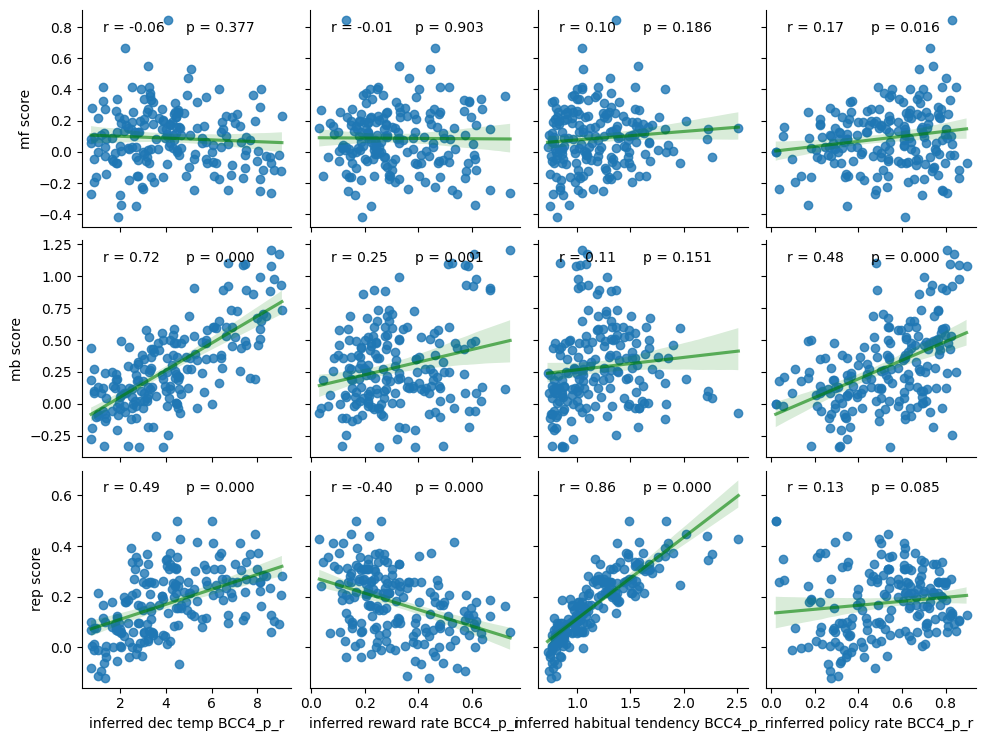

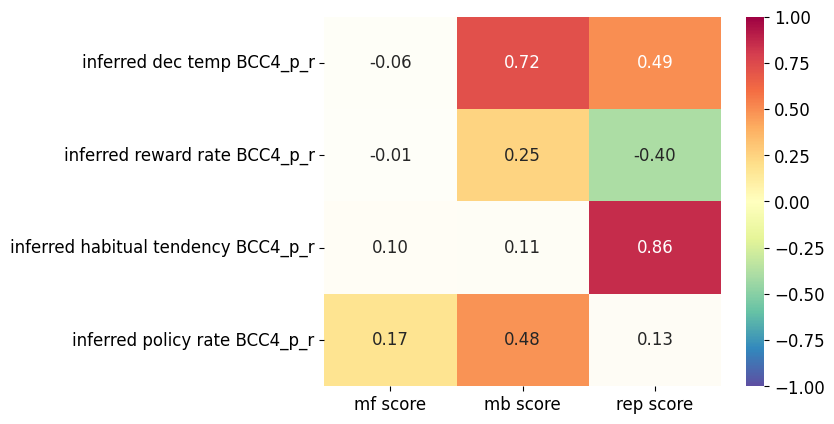

In [47]:
# BCC4 planning repetition

concat_keys_BCC4_p_r = [name+" BCC4_p_r" for name in BCC4_p_r_mean_df.keys()]

new_name_dict_BCC4_p_r = {BCC4_p_r_mean_df.keys()[i]: concat_keys_BCC4_p_r[i] for i in range(len(concat_keys_BCC4_p_r))}

renamed_BCC4_p_r = BCC4_p_r_mean_df.rename(columns=new_name_dict_BCC4_p_r)

BCC4_p_r_scores_df = pd.concat([renamed_BCC4_p_r, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = ["inferred "+name+" BCC4_p_r" for name in param_names]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=BCC4_p_r_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(BCC4_p_r_scores_df, x_vars_of_interest, y_vars_of_interest)

### BCC4 planning+repetition results: transform to beta  & omega, plot correlations with behavioral outputs: mf-/mb-scores

Index(['Unnamed: 0', 'inferred dec temp', 'subject', 'inferred reward rate',
       'inferred habitual tendency', 'inferred policy rate'],
      dtype='object')
['beta BCC4_p_r', 'omega_dt BCC4_p_r', 'omega_rep BCC4_p_r']


<Figure size 640x480 with 0 Axes>

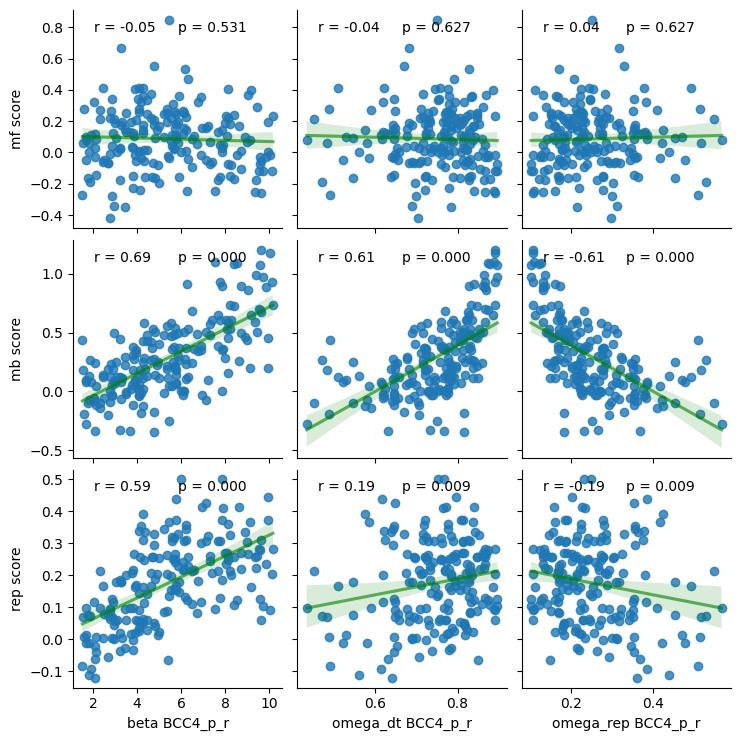

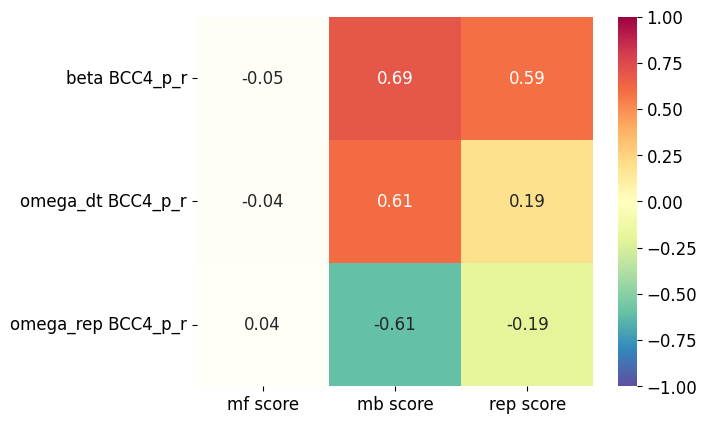

In [48]:
# BCC4 planning repetition

print(BCC4_p_r_mean_df.keys())

beta = BCC4_p_r_mean_df["inferred dec temp"] + BCC4_p_r_mean_df["inferred habitual tendency"]

omega = BCC4_p_r_mean_df["inferred dec temp"] / beta

transformed_params = ["beta", "omega_dt", "omega_rep"]

BCC4_p_r_transformed_mean_df = BCC4_p_r_mean_df.copy()

BCC4_p_r_transformed_mean_df["beta"] = beta

BCC4_p_r_transformed_mean_df["omega_dt"] = omega

BCC4_p_r_transformed_mean_df["omega_rep"] = 1-omega

concat_keys_BCC4_p_r = [name+" BCC4_p_r" for name in BCC4_p_r_transformed_mean_df.keys()]

new_name_dict_BCC4_p_r = {BCC4_p_r_transformed_mean_df.keys()[i]: concat_keys_BCC4_p_r[i] for i in range(len(concat_keys_BCC4_p_r))}

renamed_BCC4_p_r = BCC4_p_r_transformed_mean_df.rename(columns=new_name_dict_BCC4_p_r)

BCC4_p_r_scores_df = pd.concat([renamed_BCC4_p_r, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = [name+" BCC4_p_r" for name in transformed_params]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=BCC4_p_r_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(BCC4_p_r_scores_df, x_vars_of_interest, y_vars_of_interest)

### Load BCC4 planning+cached results, and plot correlations between inferred parameters

BCC_4pars_plan_cached_NO_context
BCC_4pars_plan_cached_NO_context_inference_
4
analyzing 188 data sets


/home/sarah/python_venvs/TwoStageStrategies/lib/python3.13/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(inp

<Figure size 640x480 with 0 Axes>

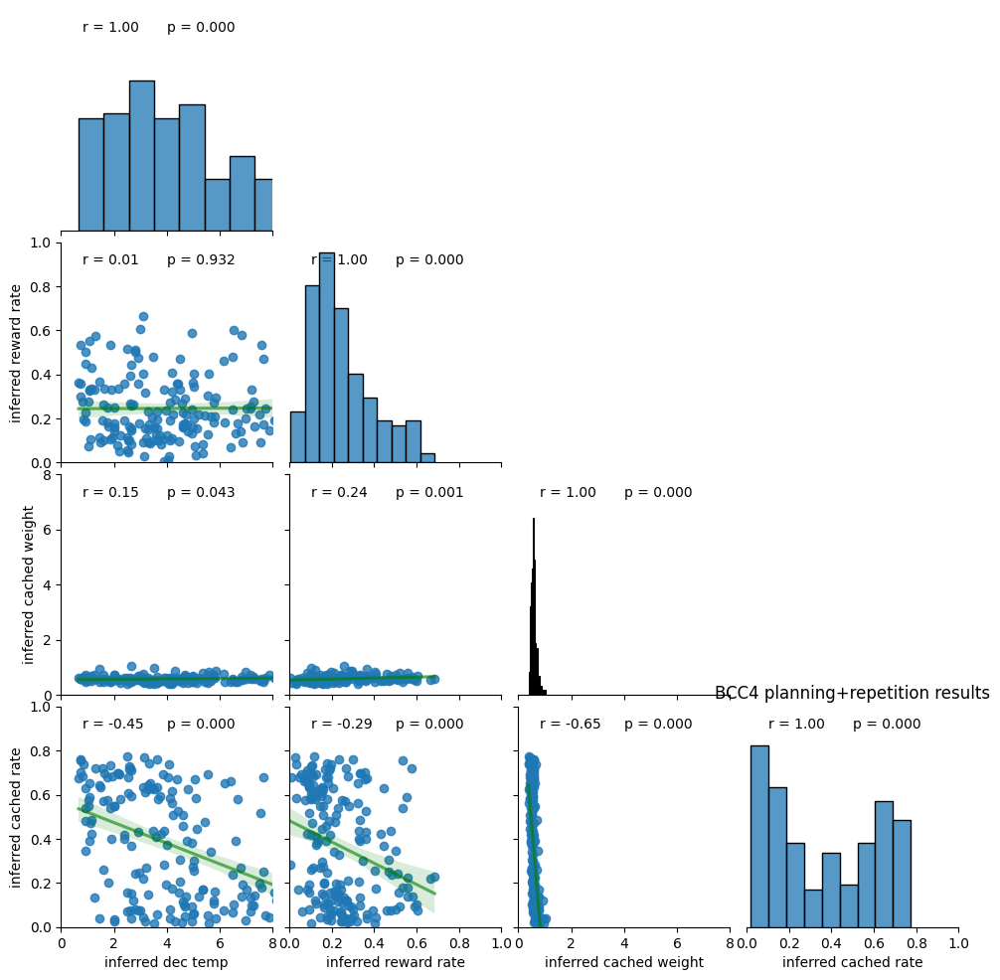

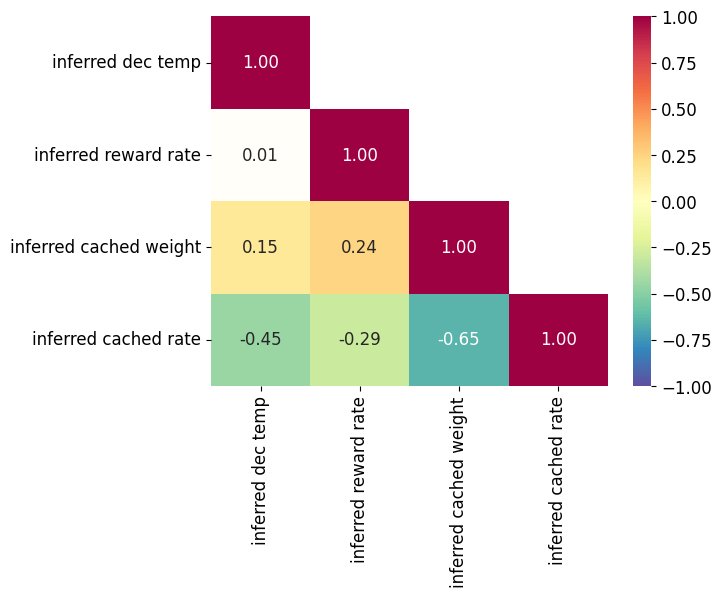

In [49]:
# BCC4 planning repetition analysis

learn_rewards = True
learn_habit = False
use_h = False
learn_cached = True

param_names = []
param_ranges = []

prefix = "BCC"
model_name = "Bayesian prior-based contextual control model"
n_pars = 0
agnt_str = ""

if learn_rewards:
    n_pars += 2
    param_names += ["dec temp", "reward rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_plan"

if learn_habit:
    # infer_h = True
    # infer_policy_rate = True 
    n_pars += 2
    agnt_str += "_habit"
    param_names += ["habitual tendency", "policy rate"]
    if use_h:
        agnt_str += "_h"
        param_ranges += [[0,1], [0,1]]
    else:
        agnt_str += "_weight"
        param_ranges += [[0,8], [0,1]]
# else:
#     infer_h = False
#     infer_policy_rate = False

if learn_cached:
    n_pars += 2
    param_names += ["cached weight", "cached rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_cached"

assert n_pars > 0, "please turn any part of the agent on, it cannot run without any learning or inference."

# choose max decision temperature for numerical stability
max_dt = 6

BCC4_p_c_param_names = param_names.copy()
BCC4_p_c_param_ranges = param_ranges.copy()

# prepare for saving results
# make base filename and folder string
agent_type = prefix+"_"+str(n_pars)+"pars"+agnt_str+"_NO_context"
print(agent_type)

# prepare for saving results
# make base filename and folder string
fname_base = agent_type+"_inference_"
print(fname_base)
# define folder where we want to save data
base_dir = os.path.join(inference_folder,fname_base[:-1])

# make directory if it doesnt exist
if fname_base[:-1] not in os.listdir(inference_folder):
    os.mkdir(base_dir)

num_steps = 600

BCC4_p_c_mean_df, BCC4_p_c_sample_df, BCC4_p_c_locs_df = load_BCC_results(learn_rewards, learn_habit, learn_cached, base_dir, global_experiment_parameters, exp_mask, fname_base, num_steps, data, param_names, use_h=False)

# param_plot_ranges = [[-0.25,1.25], [-0.25,1.25], [0,10]]

plt.figure()
vars_of_interest = ["inferred "+name for name in param_names]
f = sns.pairplot(data=BCC4_p_c_mean_df, kind='reg', diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=vars_of_interest, y_vars=vars_of_interest)
f.map(tu.annot_corrfunc)
for p, p_range in enumerate(param_ranges):
    f.axes[n_pars-1,p].set_xlim(p_range)
    f.axes[p,0].set_ylim(p_range)
plt.title("BCC4 planning+repetition results")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()


iu.plot_correlations(BCC4_p_c_mean_df, vars_of_interest, vars_of_interest)

### BCC4 planning+cached results: plot correlations with behavioral outputs: mf-/mb-scores

['inferred dec temp BCC4_p_c', 'inferred reward rate BCC4_p_c', 'inferred cached weight BCC4_p_c', 'inferred cached rate BCC4_p_c']


<Figure size 640x480 with 0 Axes>

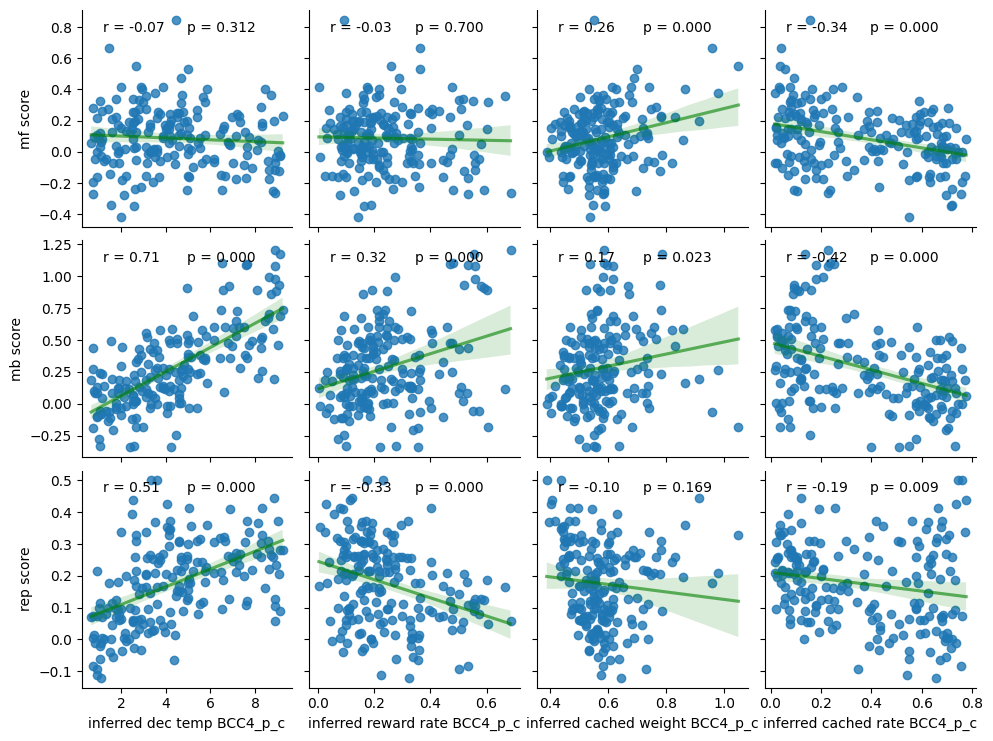

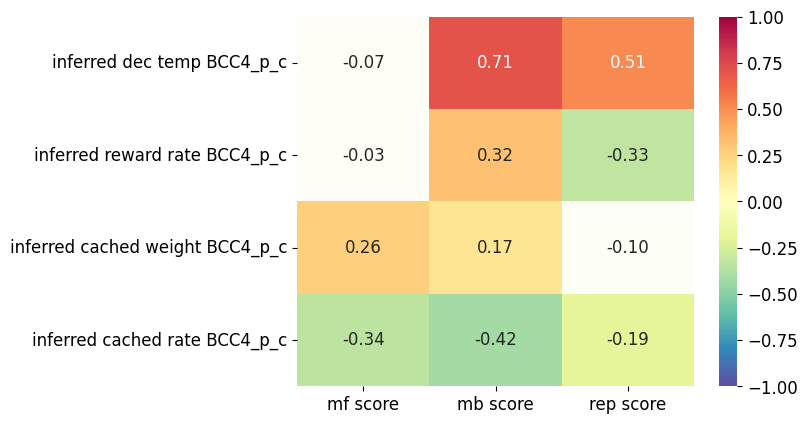

In [50]:
# BCC4 planning repetition

concat_keys_BCC4_p_c = [name+" BCC4_p_c" for name in BCC4_p_c_mean_df.keys()]

new_name_dict_BCC4_p_c = {BCC4_p_c_mean_df.keys()[i]: concat_keys_BCC4_p_c[i] for i in range(len(concat_keys_BCC4_p_c))}

renamed_BCC4_p_c = BCC4_p_c_mean_df.rename(columns=new_name_dict_BCC4_p_c)

BCC4_p_c_scores_df = pd.concat([renamed_BCC4_p_c, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = ["inferred "+name+" BCC4_p_c" for name in param_names]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=BCC4_p_c_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(BCC4_p_c_scores_df, x_vars_of_interest, y_vars_of_interest)


### BCC4 planning+cached results: transform to beta  & omega, plot correlations with behavioral outputs: mf-/mb-scores

Index(['Unnamed: 0', 'inferred dec temp', 'subject', 'inferred reward rate',
       'inferred cached weight', 'inferred cached rate'],
      dtype='object')
['beta BCC4_p_c', 'omega_dt BCC4_p_c', 'omega_cach BCC4_p_c']


<Figure size 640x480 with 0 Axes>

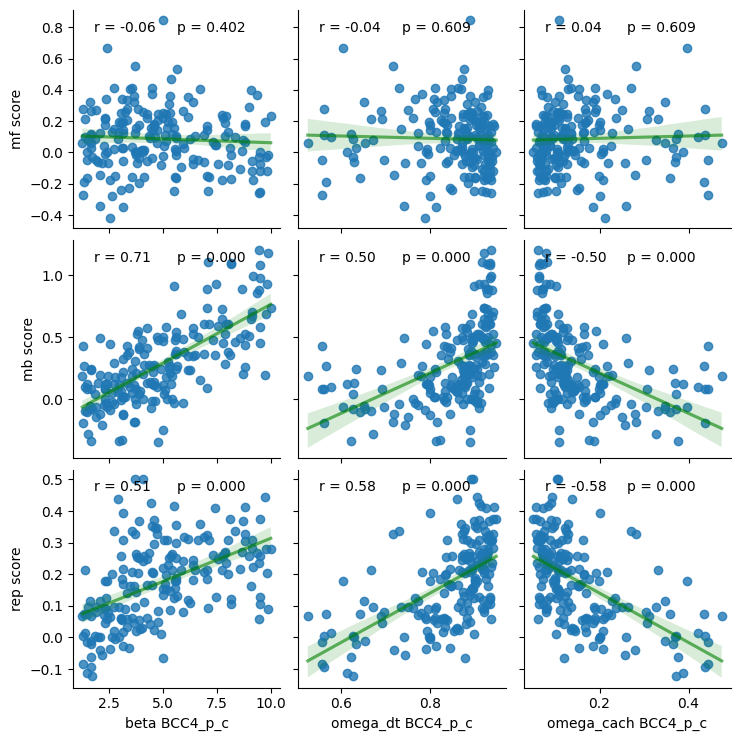

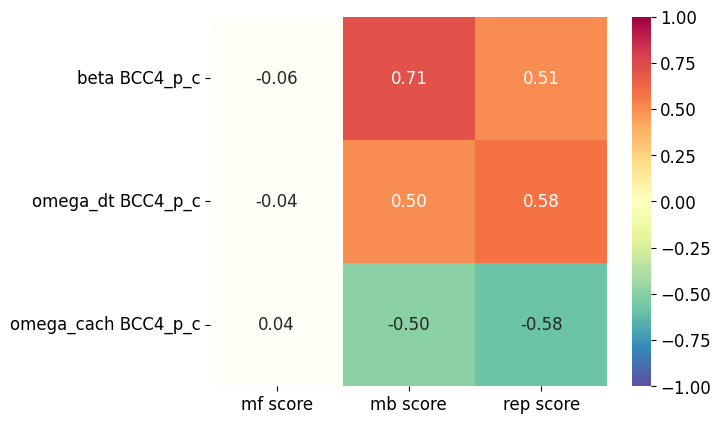

In [51]:
# BCC4 planning repetition

print(BCC4_p_c_mean_df.keys())

beta = BCC4_p_c_mean_df["inferred dec temp"] + BCC4_p_c_mean_df["inferred cached weight"]

omega = BCC4_p_c_mean_df["inferred dec temp"] / beta

transformed_params = ["beta", "omega_dt", "omega_cach"]

BCC4_p_c_transformed_mean_df = BCC4_p_c_mean_df.copy()

BCC4_p_c_transformed_mean_df["beta"] = beta

BCC4_p_c_transformed_mean_df["omega_dt"] = omega

BCC4_p_c_transformed_mean_df["omega_cach"] = 1-omega

concat_keys_BCC4_p_c = [name+" BCC4_p_c" for name in BCC4_p_c_transformed_mean_df.keys()]

new_name_dict_BCC4_p_c = {BCC4_p_c_transformed_mean_df.keys()[i]: concat_keys_BCC4_p_c[i] for i in range(len(concat_keys_BCC4_p_c))}

renamed_BCC4_p_c = BCC4_p_c_transformed_mean_df.rename(columns=new_name_dict_BCC4_p_c)

BCC4_p_c_scores_df = pd.concat([renamed_BCC4_p_c, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = [name+" BCC4_p_c" for name in transformed_params]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=BCC4_p_c_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(BCC4_p_c_scores_df, x_vars_of_interest, y_vars_of_interest)

### Load BCC6 planning+repetition+cached results, and plot correlations between inferred parameters

BCC_6pars_plan_habit_weight_cached_NO_context
BCC_6pars_plan_habit_weight_cached_NO_context_inference_
6
analyzing 188 data sets


/home/sarah/python_venvs/TwoStageStrategies/lib/python3.13/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(inp

<Figure size 640x480 with 0 Axes>

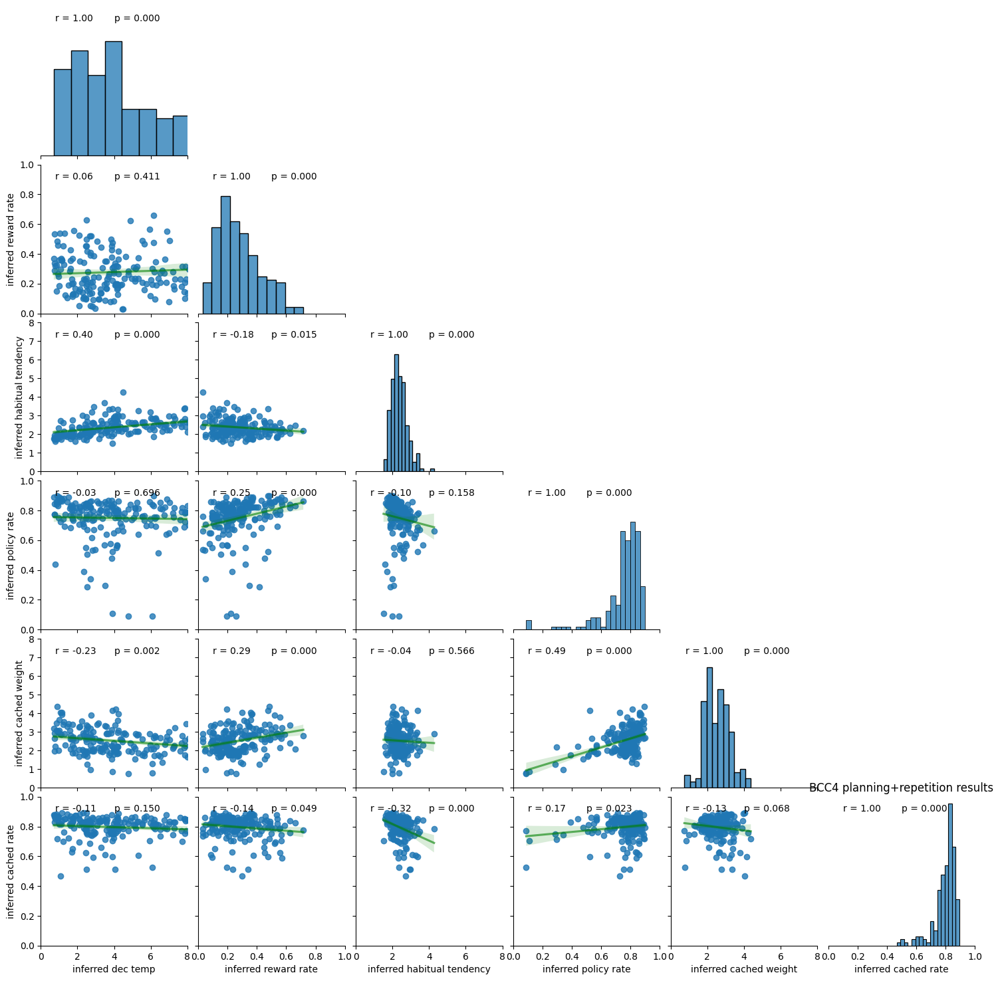

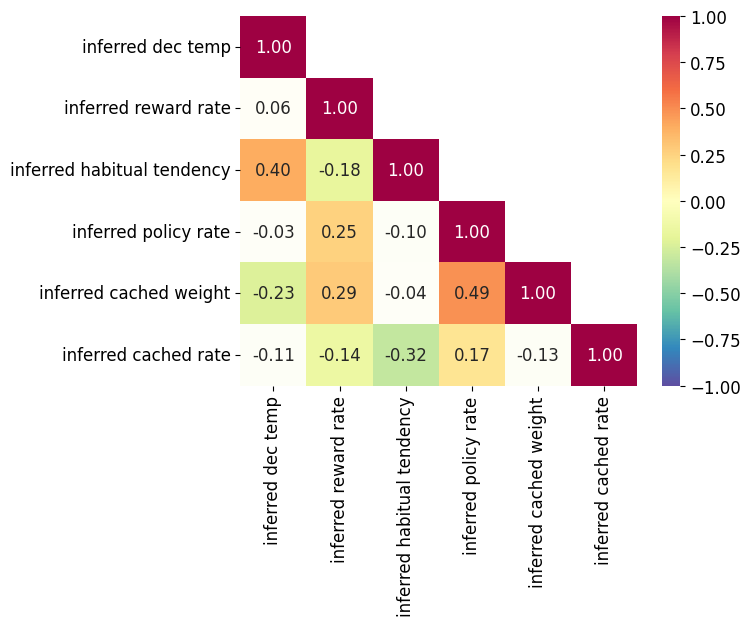

In [52]:
# BCC4 planning repetition analysis

learn_rewards = True
learn_habit = True
use_h = False
learn_cached = True

param_names = []
param_ranges = []

prefix = "BCC"
model_name = "Bayesian prior-based contextual control model"
n_pars = 0
agnt_str = ""

if learn_rewards:
    n_pars += 2
    param_names += ["dec temp", "reward rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_plan"

if learn_habit:
    # infer_h = True
    # infer_policy_rate = True 
    n_pars += 2
    agnt_str += "_habit"
    param_names += ["habitual tendency", "policy rate"]
    if use_h:
        agnt_str += "_h"
        param_ranges += [[0,1], [0,1]]
    else:
        agnt_str += "_weight"
        param_ranges += [[0,8], [0,1]]
# else:
#     infer_h = False
#     infer_policy_rate = False

if learn_cached:
    n_pars += 2
    param_names += ["cached weight", "cached rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_cached"

assert n_pars > 0, "please turn any part of the agent on, it cannot run without any learning or inference."

# choose max decision temperature for numerical stability
max_dt = 6

BCC6_param_names = param_names.copy()
BCC6_param_ranges = param_ranges.copy()

# prepare for saving results
# make base filename and folder string
agent_type = prefix+"_"+str(n_pars)+"pars"+agnt_str+"_NO_context"
print(agent_type)

# prepare for saving results
# make base filename and folder string
fname_base = agent_type+"_inference_"
print(fname_base)
# define folder where we want to save data
base_dir = os.path.join(inference_folder,fname_base[:-1])

# make directory if it doesnt exist
if fname_base[:-1] not in os.listdir(inference_folder):
    os.mkdir(base_dir)

num_steps = 600

BCC6_mean_df, BCC6_sample_df, BCC6_locs_df = load_BCC_results(learn_rewards, learn_habit, learn_cached, base_dir, global_experiment_parameters, exp_mask, fname_base, num_steps, data, param_names, use_h=False)

# param_plot_ranges = [[-0.25,1.25], [-0.25,1.25], [0,10]]

plt.figure()
vars_of_interest = ["inferred "+name for name in param_names]
f = sns.pairplot(data=BCC6_mean_df, kind='reg', diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=vars_of_interest, y_vars=vars_of_interest)
f.map(tu.annot_corrfunc)
for p, p_range in enumerate(param_ranges):
    f.axes[n_pars-1,p].set_xlim(p_range)
    f.axes[p,0].set_ylim(p_range)
plt.title("BCC4 planning+repetition results")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()

iu.plot_correlations(BCC6_mean_df, vars_of_interest, vars_of_interest)

### BCC6 planning+repetition+cached results: plot correlations with behavioral outputs: mf-/mb-scores

['inferred dec temp BCC6', 'inferred reward rate BCC6', 'inferred habitual tendency BCC6', 'inferred policy rate BCC6', 'inferred cached weight BCC6', 'inferred cached rate BCC6']


<Figure size 640x480 with 0 Axes>

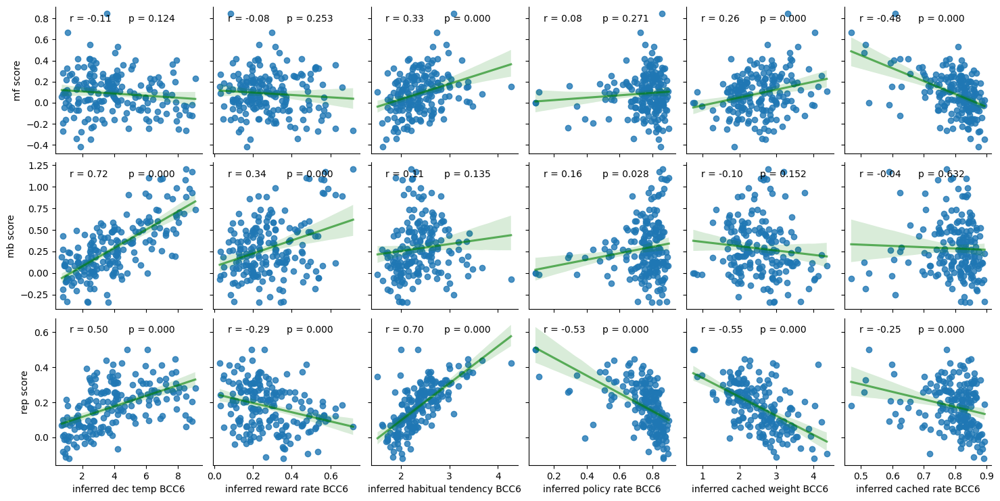

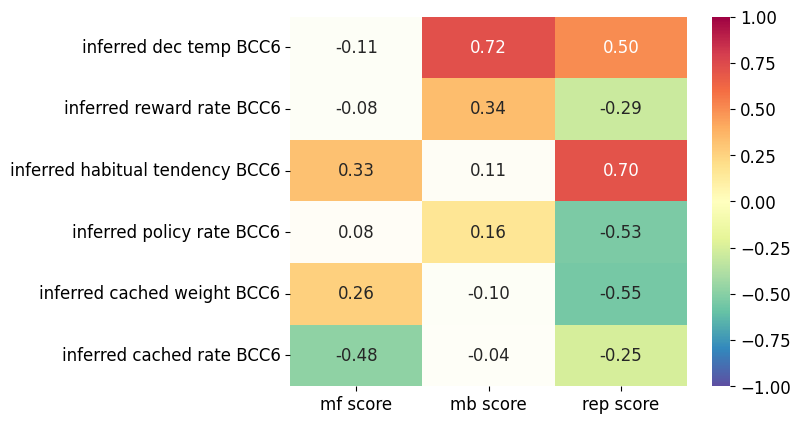

In [53]:
# BCC6

concat_keys_BCC6 = [name+" BCC6" for name in BCC6_mean_df.keys()]

new_name_dict_BCC6 = {BCC6_mean_df.keys()[i]: concat_keys_BCC6[i] for i in range(len(concat_keys_BCC6))}

renamed_BCC6 = BCC6_mean_df.rename(columns=new_name_dict_BCC6)

BCC6_scores_df = pd.concat([renamed_BCC6, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = ["inferred "+name+" BCC6" for name in param_names]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=BCC6_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(BCC6_scores_df, x_vars_of_interest, y_vars_of_interest)

### BCC6 planning+repetition+cached results: transform to beta  & omega, plot correlations with behavioral outputs: mf-/mb-scores

Index(['Unnamed: 0', 'inferred dec temp', 'subject', 'inferred reward rate',
       'inferred habitual tendency', 'inferred policy rate',
       'inferred cached weight', 'inferred cached rate'],
      dtype='object')
['beta BCC6', 'omega_dt BCC6', 'omega_rep BCC6', 'omega_cach BCC6']


<Figure size 640x480 with 0 Axes>

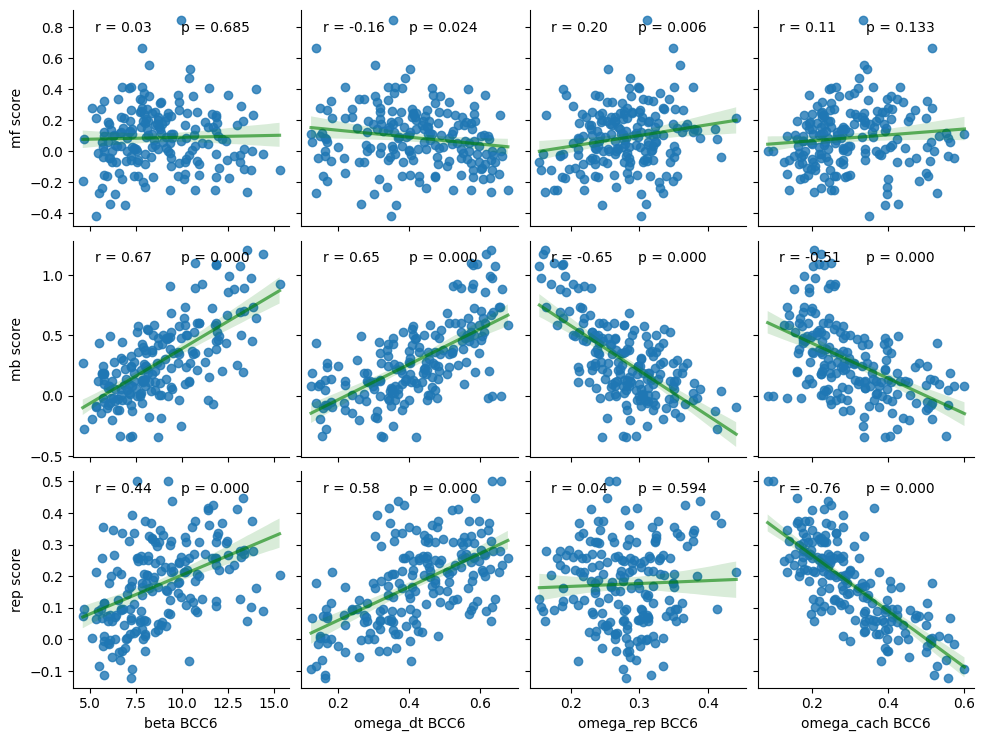

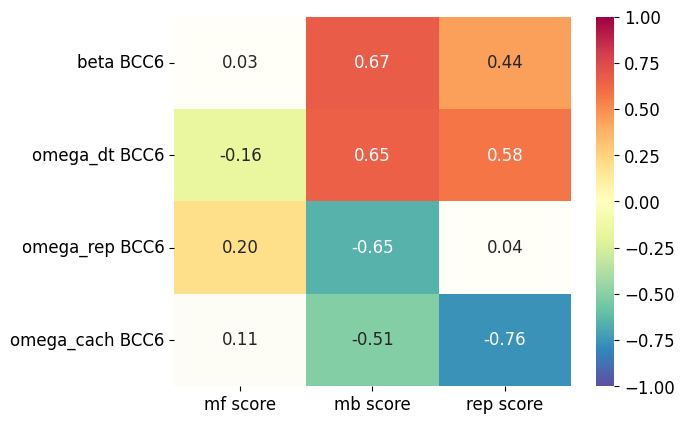

In [54]:
# BCC4 planning repetition

print(BCC6_mean_df.keys())

beta = BCC6_mean_df["inferred dec temp"] + BCC6_mean_df["inferred habitual tendency"] + BCC6_mean_df["inferred cached weight"]

omega1 = BCC6_mean_df["inferred dec temp"] / beta

omega2 = BCC6_mean_df["inferred habitual tendency"] / beta

omega3 = BCC6_mean_df["inferred cached weight"] / beta

transformed_params = ["beta", "omega_dt", "omega_rep", "omega_cach"]

BCC6_transformed_mean_df = BCC6_mean_df.copy()

BCC6_transformed_mean_df["beta"] = beta

BCC6_transformed_mean_df["omega_dt"] = omega1

BCC6_transformed_mean_df["omega_rep"] = omega2

BCC6_transformed_mean_df["omega_cach"] = omega3

concat_keys_BCC6 = [name+" BCC6" for name in BCC6_transformed_mean_df.keys()]

new_name_dict_BCC6 = {BCC6_transformed_mean_df.keys()[i]: concat_keys_BCC6[i] for i in range(len(concat_keys_BCC6))}

renamed_BCC6 = BCC6_transformed_mean_df.rename(columns=new_name_dict_BCC6)

BCC6_scores_df = pd.concat([renamed_BCC6, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = [name+" BCC6" for name in transformed_params]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=BCC6_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(BCC6_scores_df, x_vars_of_interest, y_vars_of_interest)

### Load BCC6 planning+repetition+cached results, and plot correlations between inferred parameters
### Now with reverse parameter order

BCC_6pars_plan_habit_weight_cached_NO_context_param_order
BCC_6pars_plan_habit_weight_cached_NO_context_param_order_inference_
6
analyzing 188 data sets


/home/sarah/python_venvs/TwoStageStrategies/lib/python3.13/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(inp

<Figure size 640x480 with 0 Axes>

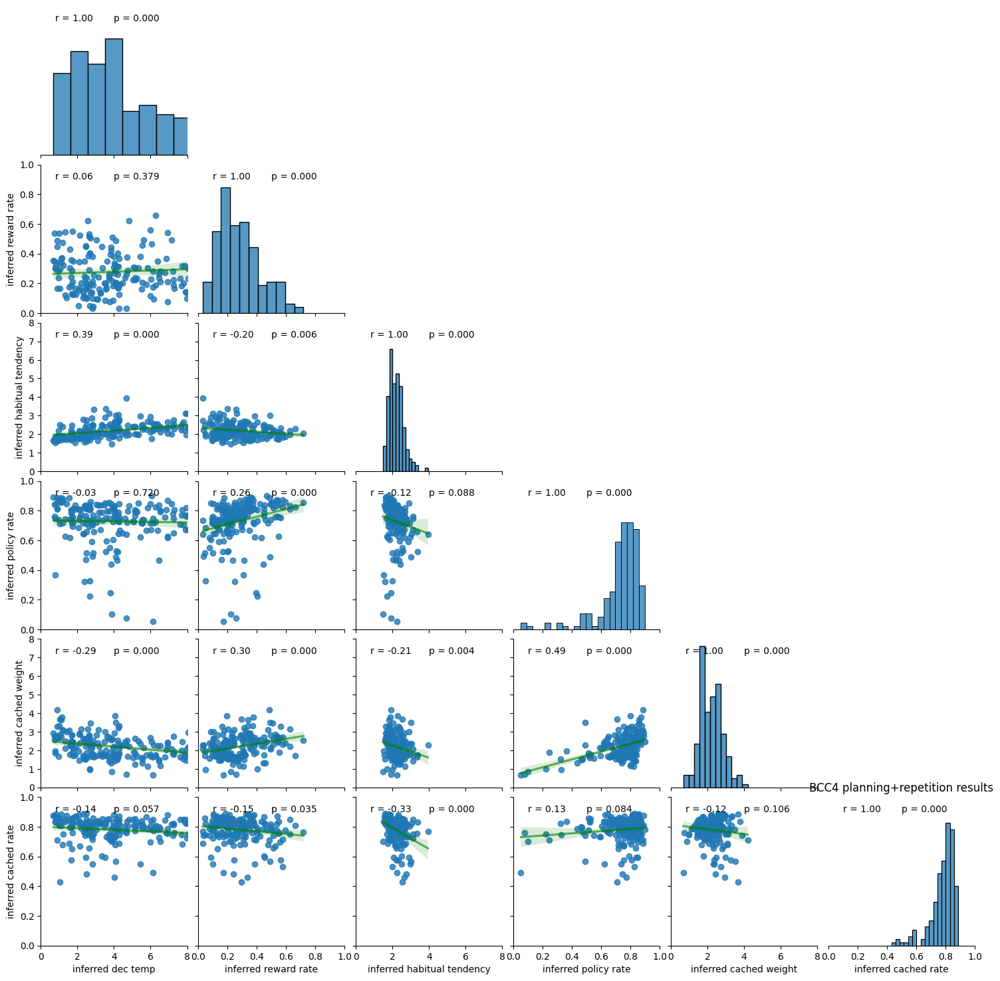

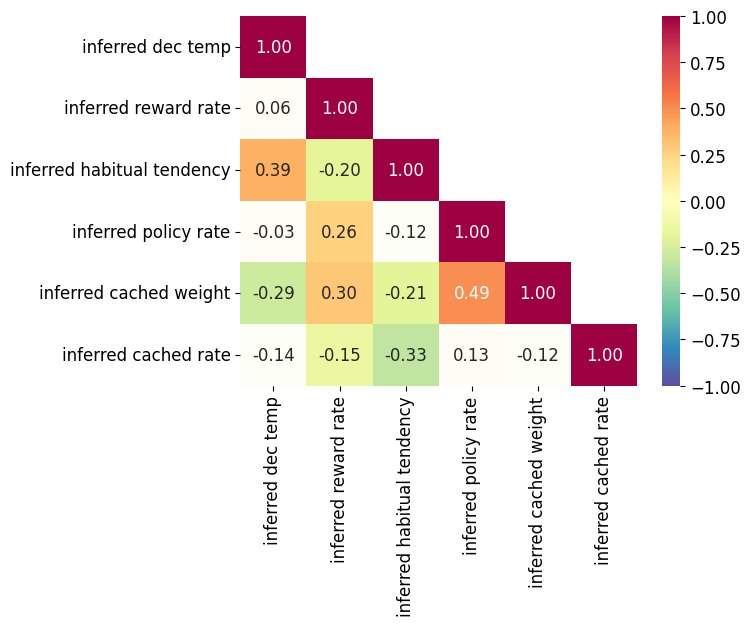

In [55]:
# BCC4 planning repetition analysis

learn_rewards = True
learn_habit = True
use_h = False
learn_cached = True

param_names = []
param_ranges = []

prefix = "BCC"
model_name = "Bayesian prior-based contextual control model"
n_pars = 0
agnt_str = ""

if learn_rewards:
    n_pars += 2
    param_names += ["dec temp", "reward rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_plan"

if learn_habit:
    # infer_h = True
    # infer_policy_rate = True 
    n_pars += 2
    agnt_str += "_habit"
    param_names += ["habitual tendency", "policy rate"]
    if use_h:
        agnt_str += "_h"
        param_ranges += [[0,1], [0,1]]
    else:
        agnt_str += "_weight"
        param_ranges += [[0,8], [0,1]]
# else:
#     infer_h = False
#     infer_policy_rate = False

if learn_cached:
    n_pars += 2
    param_names += ["cached weight", "cached rate"]
    param_ranges += [[0,8], [0,1]]
    agnt_str += "_cached"

assert n_pars > 0, "please turn any part of the agent on, it cannot run without any learning or inference."

# choose max decision temperature for numerical stability
max_dt = 6

BCC6_param_names = param_names.copy()
BCC6_param_ranges = param_ranges.copy()

# prepare for saving results
# make base filename and folder string
agent_type = prefix+"_"+str(n_pars)+"pars"+agnt_str+"_NO_context_param_order"
print(agent_type)

# prepare for saving results
# make base filename and folder string
fname_base = agent_type+"_inference_"
print(fname_base)
# define folder where we want to save data
base_dir = os.path.join(inference_folder,fname_base[:-1])

# make directory if it doesnt exist
if fname_base[:-1] not in os.listdir(inference_folder):
    os.mkdir(base_dir)

num_steps = 600

BCC6_mean_df_order, BCC6_sample_df_order, BCC6_locs_df_order = load_BCC_results(learn_rewards, learn_habit, learn_cached, base_dir, global_experiment_parameters, exp_mask, fname_base, num_steps, data, param_names, use_h=False)

# param_plot_ranges = [[-0.25,1.25], [-0.25,1.25], [0,10]]

plt.figure()
vars_of_interest = ["inferred "+name for name in param_names]
f = sns.pairplot(data=BCC6_mean_df_order, kind='reg', diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=vars_of_interest, y_vars=vars_of_interest)
f.map(tu.annot_corrfunc)
for p, p_range in enumerate(param_ranges):
    f.axes[n_pars-1,p].set_xlim(p_range)
    f.axes[p,0].set_ylim(p_range)
plt.title("BCC4 planning+repetition results")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()

iu.plot_correlations(BCC6_mean_df_order, vars_of_interest, vars_of_interest)

### BCC6 planning+repetition+cached results: plot correlations with behavioral outputs: mf-/mb-scores

['inferred dec temp BCC6', 'inferred reward rate BCC6', 'inferred habitual tendency BCC6', 'inferred policy rate BCC6', 'inferred cached weight BCC6', 'inferred cached rate BCC6']


<Figure size 640x480 with 0 Axes>

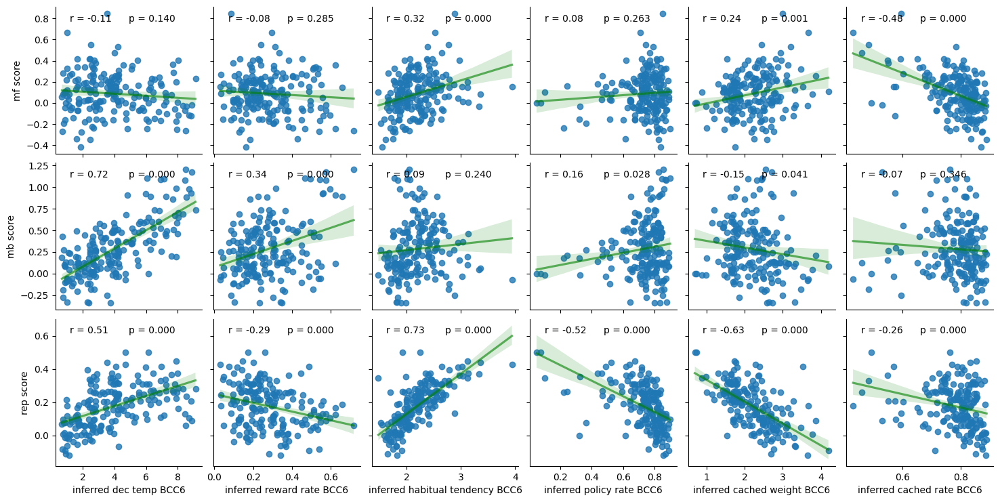

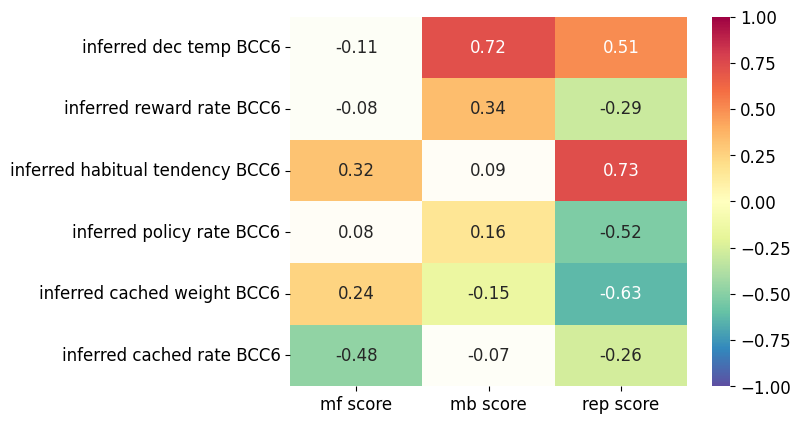

In [56]:
# BCC6

concat_keys_BCC6_order = [name+" BCC6" for name in BCC6_mean_df_order.keys()]

new_name_dict_BCC6_order = {BCC6_mean_df.keys()[i]: concat_keys_BCC6_order[i] for i in range(len(concat_keys_BCC6_order))}

renamed_BCC6_order = BCC6_mean_df_order.rename(columns=new_name_dict_BCC6_order)

BCC6_scores_df_order = pd.concat([renamed_BCC6_order, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = ["inferred "+name+" BCC6" for name in param_names]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=BCC6_scores_df_order, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(BCC6_scores_df_order, x_vars_of_interest, y_vars_of_interest)

### Sanity check: did the BCC6 and BCC4 planning+repetition analyses yield consistent results in the parameters they share?

Plotting correlations between inferred parameters of the two analyses

Index(['Unnamed: 0 BCC4_p_r', 'inferred dec temp BCC4_p_r', 'subject BCC4_p_r',
       'inferred reward rate BCC4_p_r', 'inferred habitual tendency BCC4_p_r',
       'inferred policy rate BCC4_p_r', 'Unnamed: 0 BCC6',
       'inferred dec temp BCC6', 'subject BCC6', 'inferred reward rate BCC6',
       'inferred habitual tendency BCC6', 'inferred policy rate BCC6',
       'inferred cached weight BCC6', 'inferred cached rate BCC6'],
      dtype='object')
['Unnamed: 0 BCC4_p_r', 'inferred dec temp BCC4_p_r', 'subject BCC4_p_r', 'inferred reward rate BCC4_p_r', 'inferred habitual tendency BCC4_p_r', 'inferred policy rate BCC4_p_r']
['Unnamed: 0 BCC6', 'inferred dec temp BCC6', 'subject BCC6', 'inferred reward rate BCC6', 'inferred habitual tendency BCC6', 'inferred policy rate BCC6', 'inferred cached weight BCC6', 'inferred cached rate BCC6']
Index(['Unnamed: 0 BCC6', 'inferred dec temp BCC6', 'subject BCC6',
       'inferred reward rate BCC6', 'inferred habitual tendency BCC6',
       'in

<Figure size 640x480 with 0 Axes>

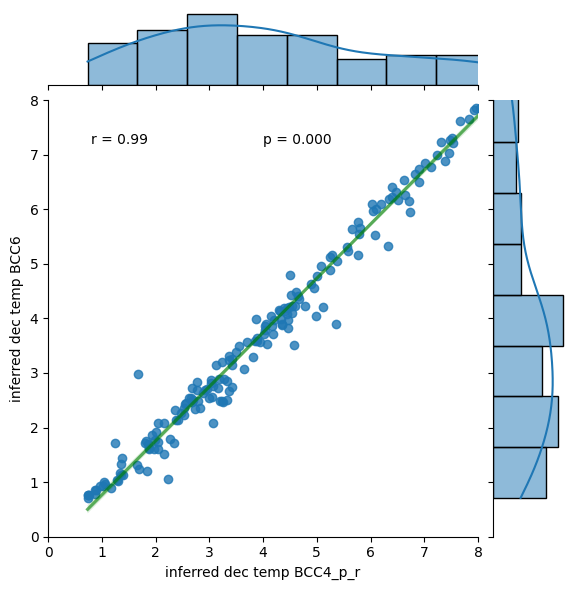

<Figure size 640x480 with 0 Axes>

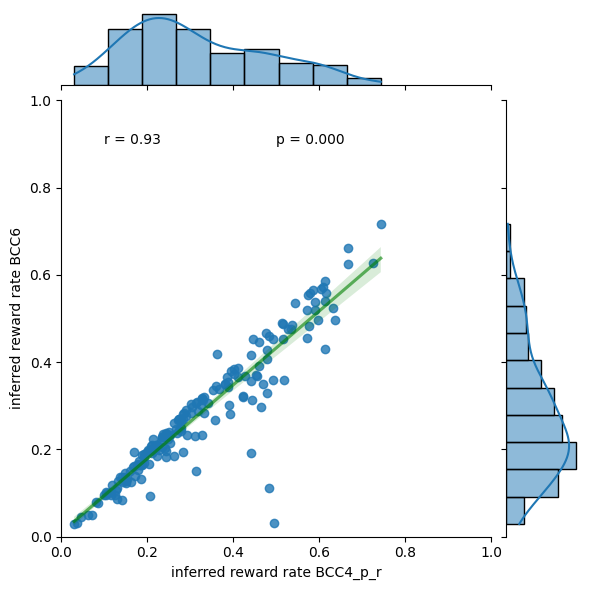

<Figure size 640x480 with 0 Axes>

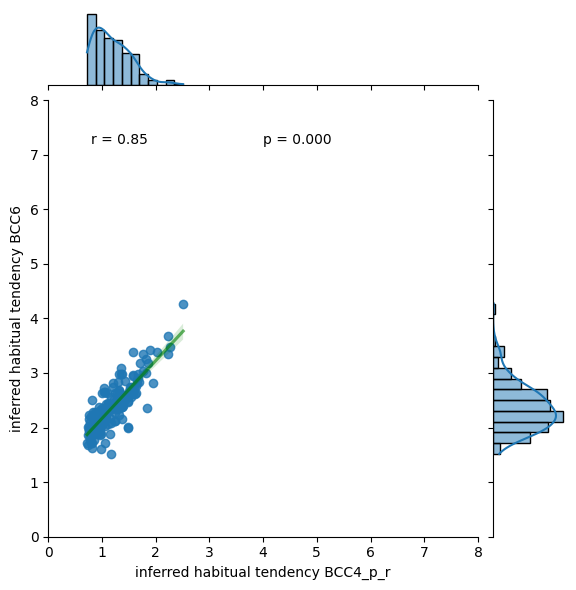

<Figure size 640x480 with 0 Axes>

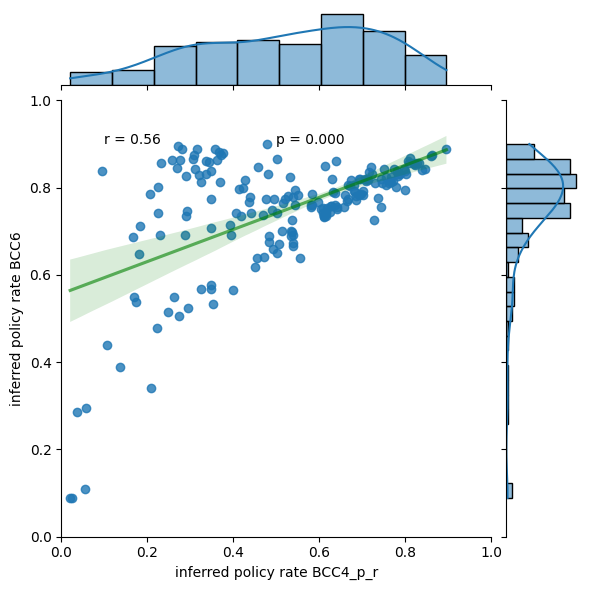

In [57]:
# compare the two results

concat_keys_BCC4_p_r = [name+" BCC4_p_r" for name in BCC4_p_r_mean_df.keys()]
concat_keys_BCC6 = [name+" BCC6" for name in BCC6_mean_df.keys()]

new_name_dict_BCC4_p_r = {BCC4_p_r_mean_df.keys()[i]: concat_keys_BCC4_p_r[i] for i in range(len(concat_keys_BCC4_p_r))}
new_name_dict_BCC6 = {BCC6_mean_df.keys()[i]: concat_keys_BCC6[i] for i in range(len(concat_keys_BCC6))}

renamed_BCC4_p_r = BCC4_p_r_mean_df.rename(columns=new_name_dict_BCC4_p_r)
renamed_BCC6 = BCC6_mean_df.rename(columns=new_name_dict_BCC6)

BCC_means_df = pd.concat([renamed_BCC4_p_r, renamed_BCC6], axis='columns')#, join="inner")

print(BCC_means_df.keys())

print(concat_keys_BCC4_p_r)
print(concat_keys_BCC6)
print(renamed_BCC6.keys())

#plt.figure()
##sns.relplot(data=BCC3_means_df, )
#sns.pairplot(data=BCC3_means_df, x_vars=a1_vars_of_interest, y_vars=a2_vars_of_interest)#, x_vars = )
#plt.show()

for i, name in enumerate(BCC4_p_r_param_names):
    plt.figure()
    #sns.scatterplot(data=BCC3_means_df, x="inferred "+name+" analysis 1", y="inferred "+name+" analysis 2")
    f = sns.jointplot(data=BCC_means_df, x="inferred "+name+" BCC4_p_r", y="inferred "+name+" BCC6", 
                  kind='reg', joint_kws={'line_kws': {'color': 'green', 'alpha': 0.6}})
    tu.annot_corrfunc(BCC_means_df["inferred "+name+" BCC4_p_r"], BCC_means_df["inferred "+name+" BCC6"])
    plt.xlim(BCC4_p_r_param_ranges[i])
    plt.ylim(BCC4_p_r_param_ranges[i])
    #plt.title("inferred "+name+" BCC3 + inferred "+name+" BCC4")
    plt.show()

#for i, name in enumerate(BCC_param_names[:-1]):
#    plt.figure()
#    #sns.scatterplot(data=BCC3_means_df, x="inferred "+name+" analysis 1", y="inferred "+name+" analysis 2")
#    sns.jointplot(data=BCC_means_df, x="inferred "+name+" BCC3", y="inferred habitual tendency BCC4")
#    plt.xlim(param_ranges[i])
#    #plt.ylim(param_ranges[i])
#    plt.show()

if False:
    BCC4_p_r_vars_of_interest = ["inferred "+name+" BCC4_p_r" for name in BCC4_p_r_param_names]
    BCC6_vars_of_interest = ["inferred "+name+" BCC6" for name in BCC4_p_r_param_names]

    iu.plot_correlations(BCC_means_df, BCC4_p_r_vars_of_interest, BCC6_vars_of_interest)

### Sanity check: did the BCC6 and BCC4 planning+cached analyses yield consistent results in the parameters they share?

Plotting correlations between inferred parameters of the two analyses

Index(['Unnamed: 0 BCC4_p_c', 'inferred dec temp BCC4_p_c', 'subject BCC4_p_c',
       'inferred reward rate BCC4_p_c', 'inferred cached weight BCC4_p_c',
       'inferred cached rate BCC4_p_c', 'Unnamed: 0 BCC6',
       'inferred dec temp BCC6', 'subject BCC6', 'inferred reward rate BCC6',
       'inferred habitual tendency BCC6', 'inferred policy rate BCC6',
       'inferred cached weight BCC6', 'inferred cached rate BCC6'],
      dtype='object')
['Unnamed: 0 BCC4_p_c', 'inferred dec temp BCC4_p_c', 'subject BCC4_p_c', 'inferred reward rate BCC4_p_c', 'inferred cached weight BCC4_p_c', 'inferred cached rate BCC4_p_c']
['Unnamed: 0 BCC6', 'inferred dec temp BCC6', 'subject BCC6', 'inferred reward rate BCC6', 'inferred habitual tendency BCC6', 'inferred policy rate BCC6', 'inferred cached weight BCC6', 'inferred cached rate BCC6']
Index(['Unnamed: 0 BCC6', 'inferred dec temp BCC6', 'subject BCC6',
       'inferred reward rate BCC6', 'inferred habitual tendency BCC6',
       'inferred p

<Figure size 640x480 with 0 Axes>

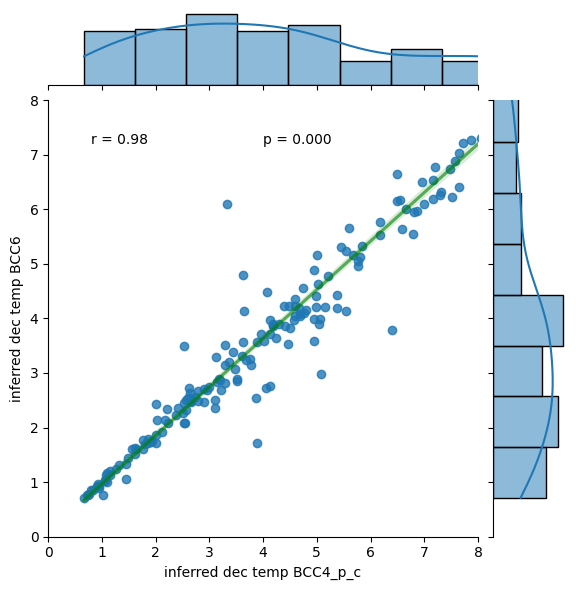

<Figure size 640x480 with 0 Axes>

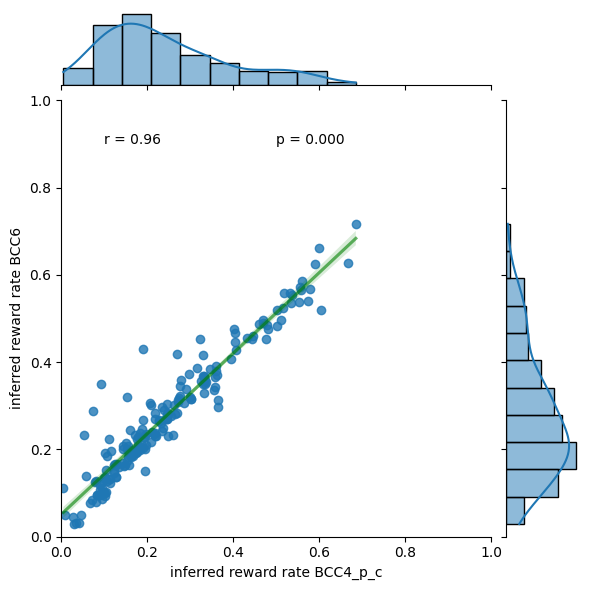

<Figure size 640x480 with 0 Axes>

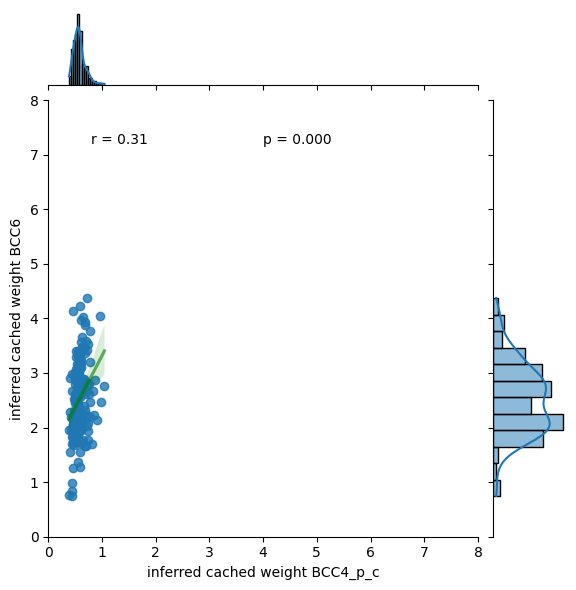

<Figure size 640x480 with 0 Axes>

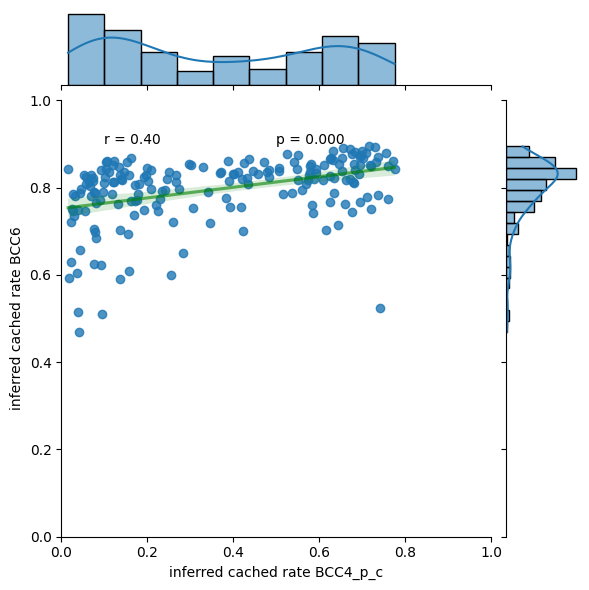

In [58]:
# compare the two results

concat_keys_BCC4_p_c = [name+" BCC4_p_c" for name in BCC4_p_c_mean_df.keys()]
concat_keys_BCC6 = [name+" BCC6" for name in BCC6_mean_df.keys()]

new_name_dict_BCC4_p_c = {BCC4_p_c_mean_df.keys()[i]: concat_keys_BCC4_p_c[i] for i in range(len(concat_keys_BCC4_p_c))}
new_name_dict_BCC6 = {BCC6_mean_df.keys()[i]: concat_keys_BCC6[i] for i in range(len(concat_keys_BCC6))}

renamed_BCC4_p_c = BCC4_p_c_mean_df.rename(columns=new_name_dict_BCC4_p_c)
renamed_BCC6 = BCC6_mean_df.rename(columns=new_name_dict_BCC6)

BCC_means_df = pd.concat([renamed_BCC4_p_c, renamed_BCC6], axis='columns')#, join="inner")

print(BCC_means_df.keys())

print(concat_keys_BCC4_p_c)
print(concat_keys_BCC6)
print(renamed_BCC6.keys())

BCC4_p_c_vars_of_interest = ["inferred "+name+" BCC4_p_c" for name in BCC4_p_c_param_names]
BCC6_vars_of_interest = ["inferred "+name+" BCC6" for name in BCC6_param_names]

#plt.figure()
##sns.relplot(data=BCC3_means_df, )
#sns.pairplot(data=BCC3_means_df, x_vars=a1_vars_of_interest, y_vars=a2_vars_of_interest)#, x_vars = )
#plt.show()

for i, name in enumerate(BCC4_p_c_param_names):
    plt.figure()
    #sns.scatterplot(data=BCC3_means_df, x="inferred "+name+" analysis 1", y="inferred "+name+" analysis 2")
    f = sns.jointplot(data=BCC_means_df, x="inferred "+name+" BCC4_p_c", y="inferred "+name+" BCC6", 
                  kind='reg', joint_kws={'line_kws': {'color': 'green', 'alpha': 0.6}})
    tu.annot_corrfunc(BCC_means_df["inferred "+name+" BCC4_p_c"], BCC_means_df["inferred "+name+" BCC6"])
    plt.xlim(BCC4_p_c_param_ranges[i])
    plt.ylim(BCC4_p_c_param_ranges[i])
    #plt.title("inferred "+name+" BCC3 + inferred "+name+" BCC4")
    plt.show()

#for i, name in enumerate(BCC_param_names[:-1]):
#    plt.figure()
#    #sns.scatterplot(data=BCC3_means_df, x="inferred "+name+" analysis 1", y="inferred "+name+" analysis 2")
#    sns.jointplot(data=BCC_means_df, x="inferred "+name+" BCC3", y="inferred habitual tendency BCC4")
#    plt.xlim(param_ranges[i])
#    #plt.ylim(param_ranges[i])
#    plt.show()

if False:

    BCC4_p_c_vars_of_interest = ["inferred "+name+" BCC4_p_c" for name in BCC4_p_c_param_names]
    BCC6_vars_of_interest = ["inferred "+name+" BCC6" for name in BCC4_p_c_param_names]

    iu.plot_correlations(BCC_means_df, BCC4_p_c_vars_of_interest, BCC6_vars_of_interest)

### Sanity check: did the BCC6 and BCC6 param order analyses yield consistent results in the parameters they share?

Plotting correlations between inferred parameters of the two analyses

Index(['Unnamed: 0 BCC6_order', 'inferred dec temp BCC6_order',
       'subject BCC6_order', 'inferred reward rate BCC6_order',
       'inferred habitual tendency BCC6_order',
       'inferred policy rate BCC6_order', 'inferred cached weight BCC6_order',
       'inferred cached rate BCC6_order', 'Unnamed: 0 BCC6',
       'inferred dec temp BCC6', 'subject BCC6', 'inferred reward rate BCC6',
       'inferred habitual tendency BCC6', 'inferred policy rate BCC6',
       'inferred cached weight BCC6', 'inferred cached rate BCC6'],
      dtype='object')
['Unnamed: 0 BCC6_order', 'inferred dec temp BCC6_order', 'subject BCC6_order', 'inferred reward rate BCC6_order', 'inferred habitual tendency BCC6_order', 'inferred policy rate BCC6_order', 'inferred cached weight BCC6_order', 'inferred cached rate BCC6_order']
['Unnamed: 0 BCC6', 'inferred dec temp BCC6', 'subject BCC6', 'inferred reward rate BCC6', 'inferred habitual tendency BCC6', 'inferred policy rate BCC6', 'inferred cached weight BCC

<Figure size 640x480 with 0 Axes>

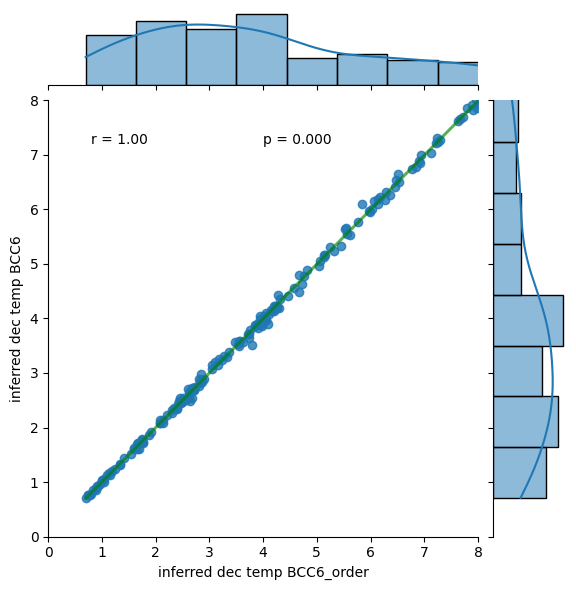

<Figure size 640x480 with 0 Axes>

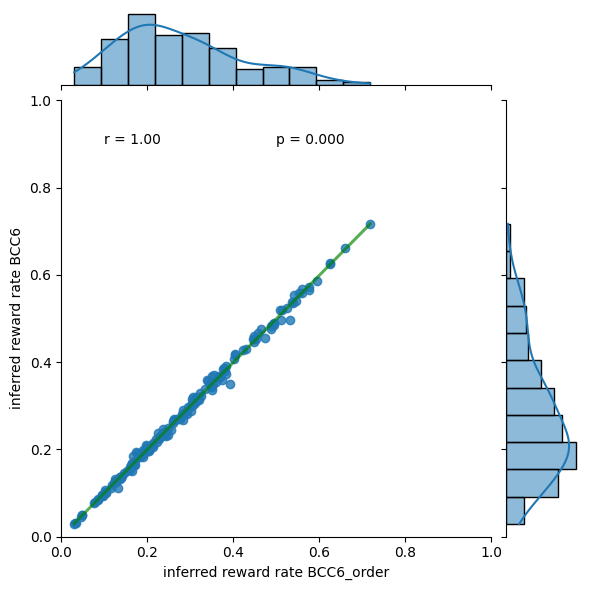

<Figure size 640x480 with 0 Axes>

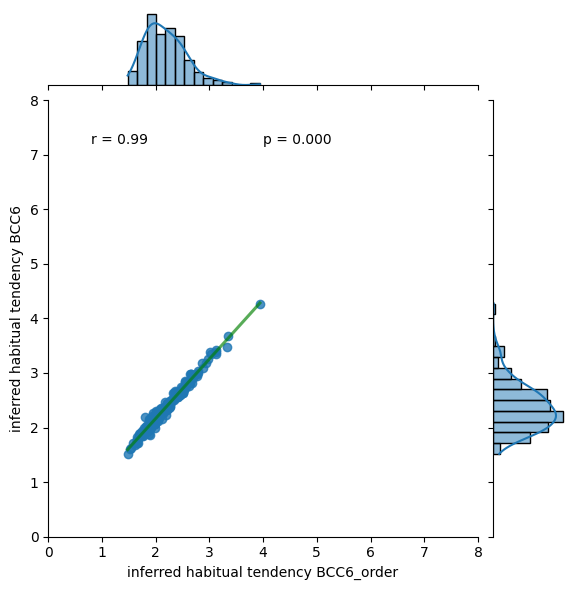

<Figure size 640x480 with 0 Axes>

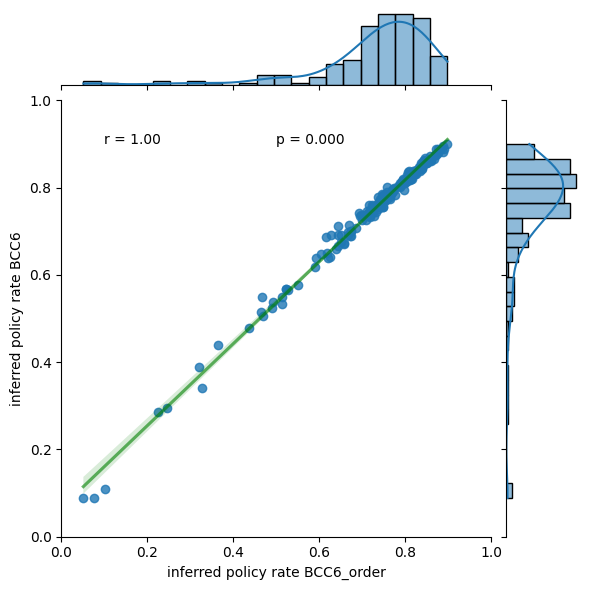

<Figure size 640x480 with 0 Axes>

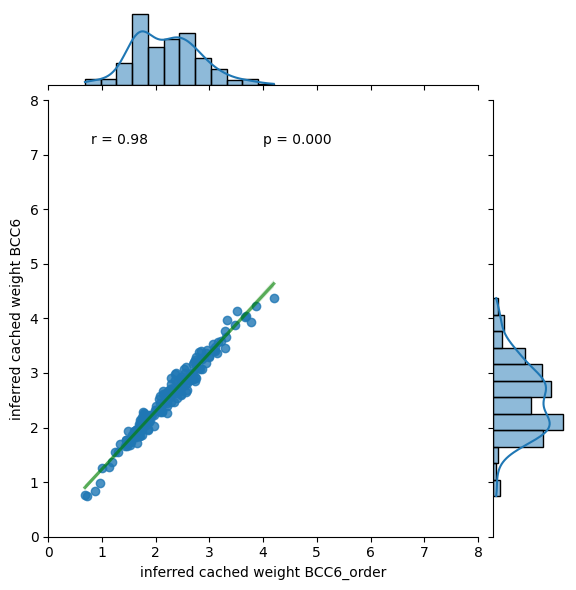

<Figure size 640x480 with 0 Axes>

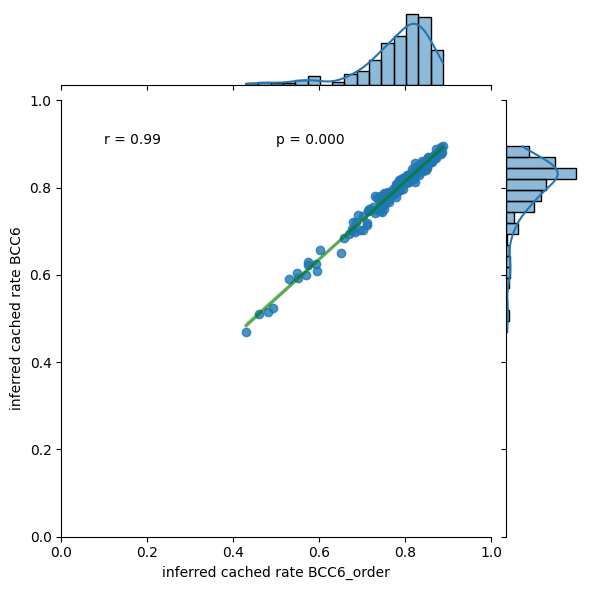

In [59]:
# compare the two results

concat_keys_BCC6_order = [name+" BCC6_order" for name in BCC6_mean_df_order.keys()]
concat_keys_BCC6 = [name+" BCC6" for name in BCC6_mean_df.keys()]

new_name_dict_BCC6_order = {BCC6_mean_df_order.keys()[i]: concat_keys_BCC6_order[i] for i in range(len(concat_keys_BCC6_order))}
new_name_dict_BCC6 = {BCC6_mean_df.keys()[i]: concat_keys_BCC6[i] for i in range(len(concat_keys_BCC6))}

renamed_BCC6_order = BCC6_mean_df_order.rename(columns=new_name_dict_BCC6_order)
renamed_BCC6 = BCC6_mean_df.rename(columns=new_name_dict_BCC6)

BCC_means_df = pd.concat([renamed_BCC6_order, renamed_BCC6], axis='columns')#, join="inner")

print(BCC_means_df.keys())

print(concat_keys_BCC6_order)
print(concat_keys_BCC6)
print(renamed_BCC6.keys())

BCC6_order_vars_of_interest = ["inferred "+name+" BCC6_order" for name in BCC6_param_names]
BCC6_vars_of_interest = ["inferred "+name+" BCC6" for name in BCC6_param_names]

#plt.figure()
##sns.relplot(data=BCC3_means_df, )
#sns.pairplot(data=BCC3_means_df, x_vars=a1_vars_of_interest, y_vars=a2_vars_of_interest)#, x_vars = )
#plt.show()

for i, name in enumerate(BCC6_param_names):
    plt.figure()
    #sns.scatterplot(data=BCC3_means_df, x="inferred "+name+" analysis 1", y="inferred "+name+" analysis 2")
    f = sns.jointplot(data=BCC_means_df, x="inferred "+name+" BCC6_order", y="inferred "+name+" BCC6", 
                  kind='reg', joint_kws={'line_kws': {'color': 'green', 'alpha': 0.6}})
    tu.annot_corrfunc(BCC_means_df["inferred "+name+" BCC6_order"], BCC_means_df["inferred "+name+" BCC6"])
    plt.xlim(BCC6_param_ranges[i])
    plt.ylim(BCC6_param_ranges[i])
    #plt.title("inferred "+name+" BCC3 + inferred "+name+" BCC4")
    plt.show()

#for i, name in enumerate(BCC_param_names[:-1]):
#    plt.figure()
#    #sns.scatterplot(data=BCC3_means_df, x="inferred "+name+" analysis 1", y="inferred "+name+" analysis 2")
#    sns.jointplot(data=BCC_means_df, x="inferred "+name+" BCC3", y="inferred habitual tendency BCC4")
#    plt.xlim(param_ranges[i])
#    #plt.ylim(param_ranges[i])
#    plt.show()

if False:

    BCC6_order_vars_of_interest = ["inferred "+name+" BCC6_order" for name in BCC6_param_names]
    BCC6_vars_of_interest = ["inferred "+name+" BCC6" for name in BCC6_param_names]

    iu.plot_correlations(BCC_means_df, BCC6_vars_of_interest, BCC6_vars_of_interest)

### Load MFMB4 analysis, and plot correlations between inferred parameters

mbmf__inference_
analyzing 188 data sets


/home/sarah/python_venvs/TwoStageStrategies/lib/python3.13/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(inp

<Figure size 640x480 with 0 Axes>

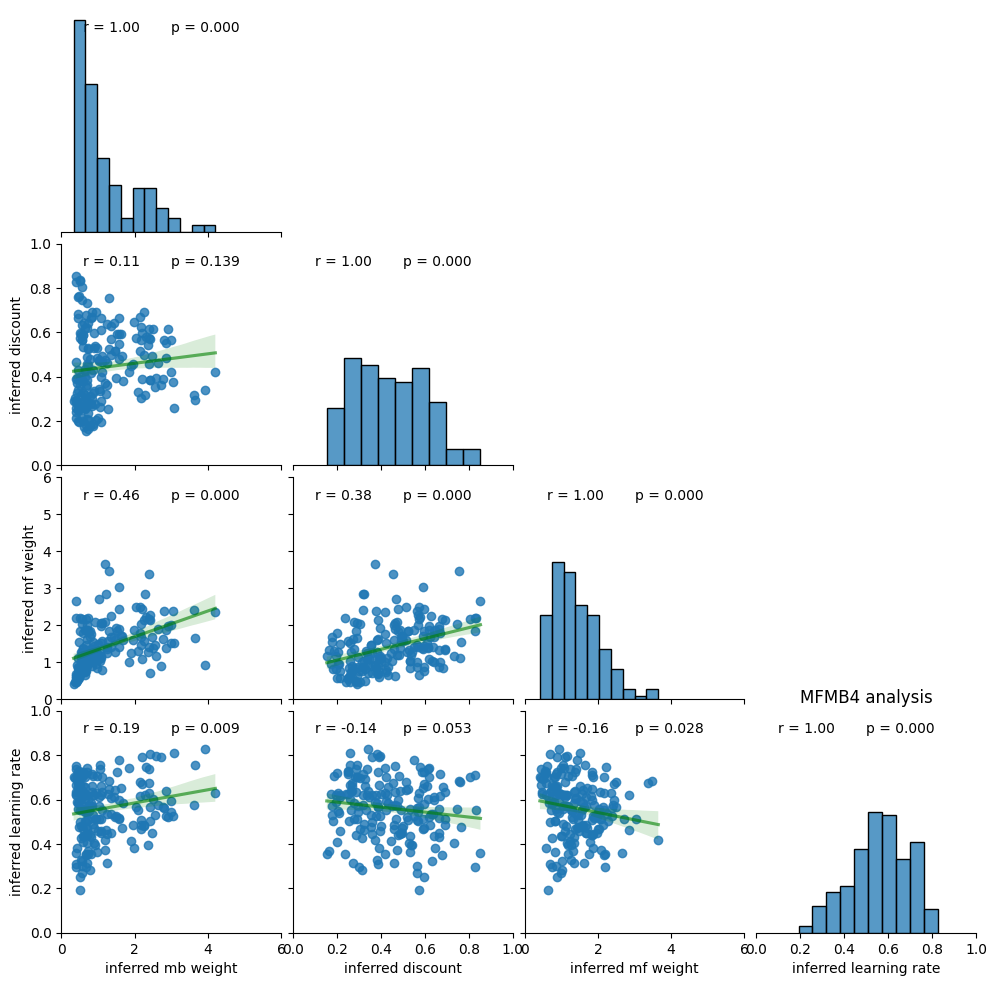

This is inference for the twostage task using the two beta mbmf model(mbmf_) with 188 agents.
The settings are: use p False


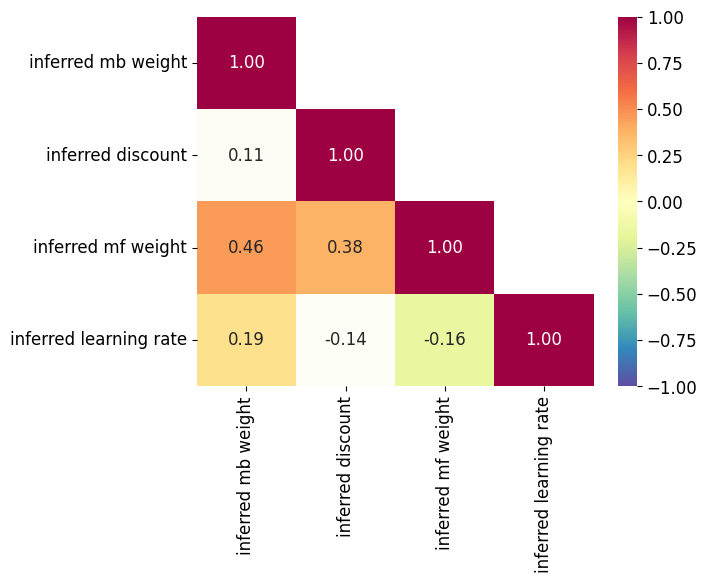

In [60]:
# MFMB4 analysis

# set parameters and their names
learn_prior = False

use_orig = False

use_p = False
restrict_alpha = False
max_dt = 6

n_pars = 4

agnt_str = ""

if use_orig:
    agnt_str += "mbmfOrig_"
    param_names = ["discount", "learning rate", "dec temp", "weight"]
    model_name = "original original w and beta model"
    param_ranges = [[0,1], [0,1], [0,8], [0,1]]
else:
    agnt_str += "mbmf_"
    param_names = ["mb weight", "discount", "mf weight", "learning rate"]
    model_name = "two beta mbmf model"
    param_ranges = [[0,max_dt], [0,1], [0,max_dt], [0,1]]


if learn_prior:
    n_pars += 2
    param_names += ["prior lr", "prior weight"]
    param_ranges += [[0,1], [0,max_dt]]
    agnt_str += "_prior"

if use_p:
    n_pars += 1
    agnt_str += "_p"
    param_names += ["repetition"]
    
if restrict_alpha:
    agnt_str += "_resticted"
    min_alpha = 0.1
else:
    min_alpha = 0

# prepare for saving results
# make base filename and folder string
agent_type = agnt_str

MFMB4_param_names = param_names.copy()
MFMB4_param_ranges = param_ranges.copy()

# prepare for saving results
# make base filename and folder string
fname_base = agent_type+"_inference_"
print(fname_base)
# define folder where we want to save data
base_dir = os.path.join(inference_folder,fname_base[:-1])

# make directory if it doesnt exist
if fname_base[:-1] not in os.listdir(inference_folder):
    os.mkdir(base_dir)

num_steps = 600

MFMB4_mean_df, MFMB4_sample_df, MFMB4_locs_df = load_MFMB_results(use_orig, learn_prior, use_p, restrict_alpha, max_dt, base_dir, global_experiment_parameters, data["valid"], fname_base, num_steps, data, MFMB4_param_names)

plt.figure()
vars_of_interest = ["inferred "+name for name in MFMB4_param_names]
f = sns.pairplot(data=MFMB4_mean_df, kind='reg', diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=vars_of_interest, y_vars=vars_of_interest)
f.map(tu.annot_corrfunc)
for p, p_range in enumerate(MFMB4_param_ranges):
    f.axes[n_pars-1,p].set_xlim(p_range)
    f.axes[p,0].set_ylim(p_range)
plt.title("MFMB4 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()
        
print("This is inference for the twostage task using the "+model_name+"("+agent_type+")"+" with "+str(n_agents)+" agents.")
print("The settings are: use p", use_p)

iu.plot_correlations(MFMB4_mean_df, vars_of_interest, vars_of_interest)

### MFMB4: plot correlations with behavioral outputs: mf-/mb-scores

['inferred mb weight MFMB4', 'inferred discount MFMB4', 'inferred mf weight MFMB4', 'inferred learning rate MFMB4']


<Figure size 640x480 with 0 Axes>

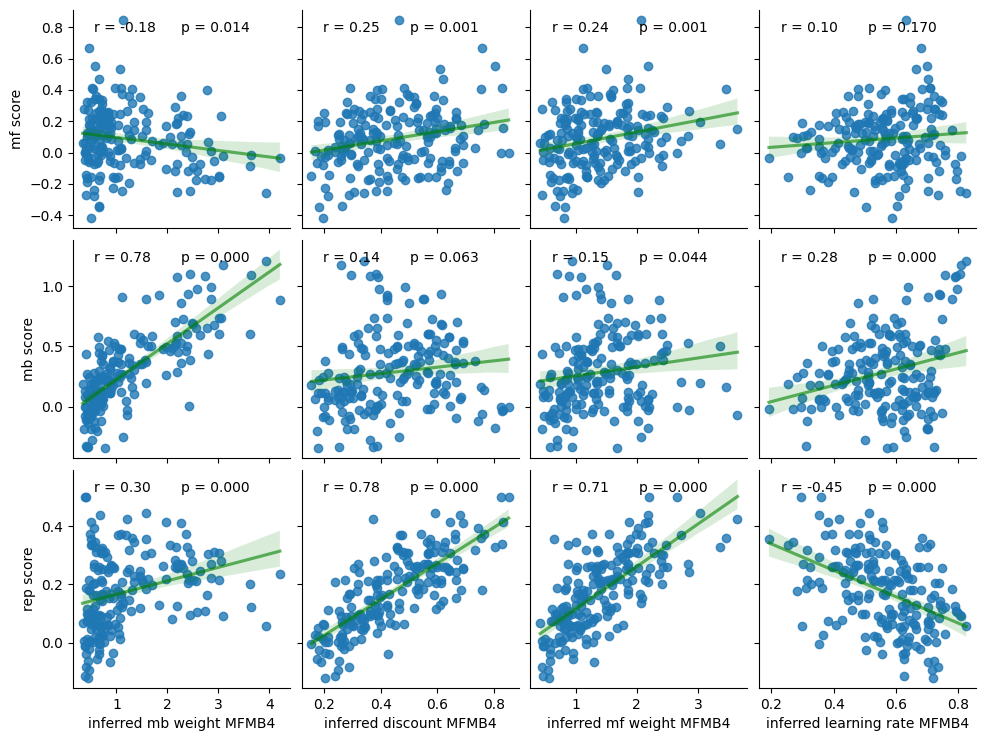

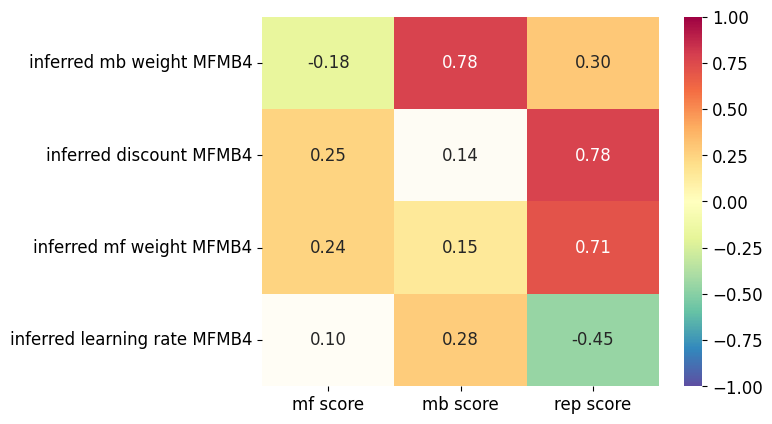

In [61]:
# MFMB4

concat_keys_MFMB4 = [name+" MFMB4" for name in MFMB4_mean_df.keys()]

new_name_dict_MFMB4 = {MFMB4_mean_df.keys()[i]: concat_keys_MFMB4[i] for i in range(len(concat_keys_MFMB4))}

renamed_MFMB4 = MFMB4_mean_df.rename(columns=new_name_dict_MFMB4)

MFMB4_scores_df = pd.concat([renamed_MFMB4, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = ["inferred "+name+" MFMB4" for name in MFMB4_param_names]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=MFMB4_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "MFMB4_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(MFMB4_scores_df, x_vars_of_interest, y_vars_of_interest)

### MFMB4: transform to beta  & omega, plot correlations with behavioral outputs: mf-/mb-scores

Index(['Unnamed: 0', 'inferred mb weight', 'subject', 'inferred discount',
       'inferred mf weight', 'inferred learning rate'],
      dtype='object')
['beta MFMB4', 'omega_mb MFMB4', 'omega_mf MFMB4']


<Figure size 640x480 with 0 Axes>

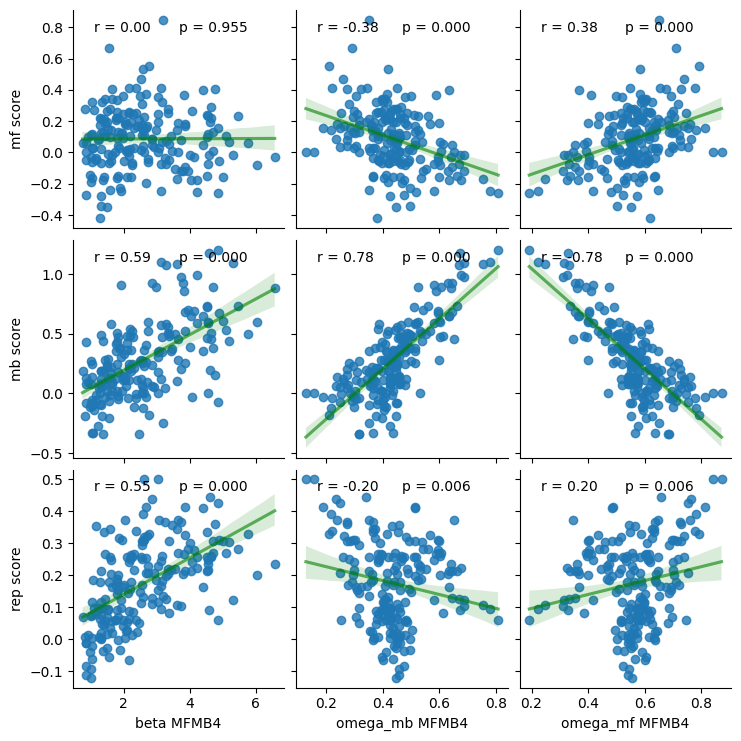

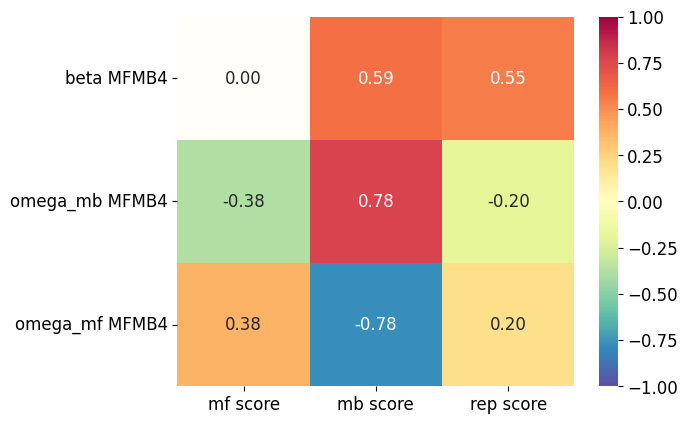

In [62]:
# BCC4 planning repetition

print(MFMB4_mean_df.keys())

beta = MFMB4_mean_df["inferred mb weight"] + MFMB4_mean_df["inferred mf weight"]

omega = MFMB4_mean_df["inferred mb weight"] / beta

transformed_params = ["beta", "omega_mb", "omega_mf"]

MFMB4_transformed_mean_df = MFMB4_mean_df.copy()

MFMB4_transformed_mean_df["beta"] = beta

MFMB4_transformed_mean_df["omega_mb"] = omega

MFMB4_transformed_mean_df["omega_mf"] = 1-omega

concat_keys_MFMB4 = [name+" MFMB4" for name in MFMB4_transformed_mean_df.keys()]

new_name_dict_MFMB4 = {MFMB4_transformed_mean_df.keys()[i]: concat_keys_MFMB4[i] for i in range(len(concat_keys_MFMB4))}

renamed_MFMB4 = MFMB4_transformed_mean_df.rename(columns=new_name_dict_MFMB4)

MFMB4_scores_df = pd.concat([renamed_MFMB4, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = [name+" MFMB4" for name in transformed_params]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=MFMB4_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(MFMB4_scores_df, x_vars_of_interest, y_vars_of_interest)

### Load MFMB6 analysis, and plot correlations between inferred parameters

mbmf__prior_inference_
analyzing 188 data sets


/home/sarah/python_venvs/TwoStageStrategies/lib/python3.13/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(inp

<Figure size 640x480 with 0 Axes>

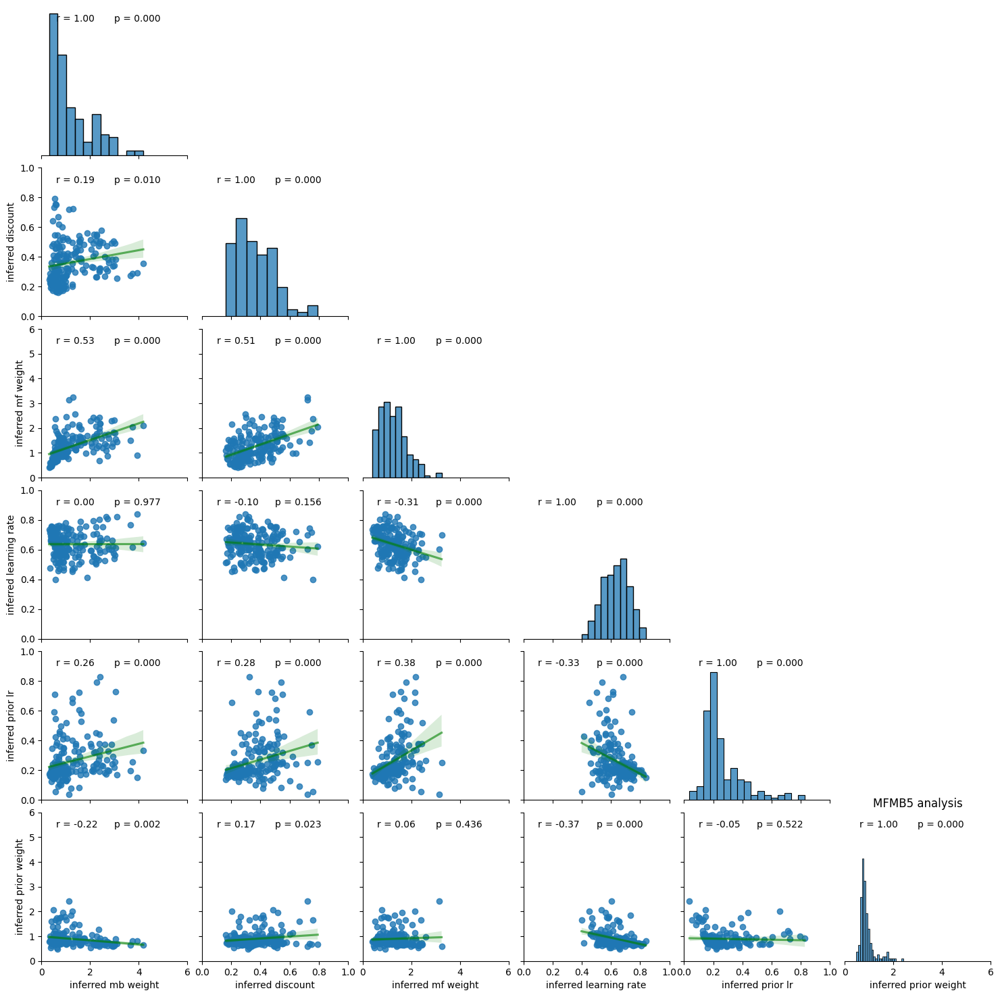

This is inference for the twostage task using the two beta mbmf model(mbmf__prior) with 188 agents.
The settings are: use p False


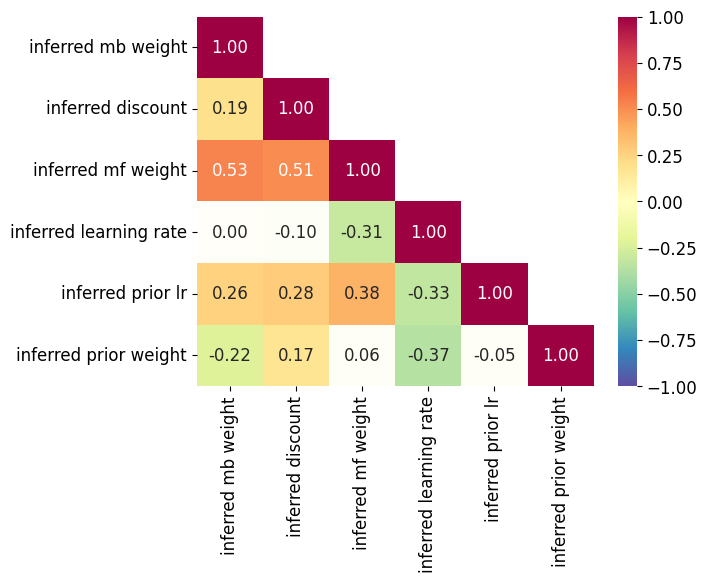

In [63]:
# MFMB6 analysis

# set parameters and their names
learn_prior = True

use_orig = False

use_p = False
restrict_alpha = False
max_dt = 6

n_pars = 4

agnt_str = ""

if use_orig:
    agnt_str += "mbmfOrig_"
    param_names = ["discount", "learning rate", "dec temp", "weight"]
    model_name = "original original w and beta model"
    param_ranges = [[0,1], [0,1], [0,8], [0,1]]
else:
    agnt_str += "mbmf_"
    param_names = ["mb weight", "discount", "mf weight", "learning rate"]
    model_name = "two beta mbmf model"
    param_ranges = [[0,max_dt], [0,1], [0,max_dt], [0,1]]


if learn_prior:
    n_pars += 2
    param_names += ["prior lr", "prior weight"]
    param_ranges += [[0,1], [0,max_dt]]
    agnt_str += "_prior"

if use_p:
    n_pars += 1
    agnt_str += "_p"
    param_names += ["repetition"]
    
if restrict_alpha:
    agnt_str += "_resticted"
    min_alpha = 0.1
else:
    min_alpha = 0

# prepare for saving results
# make base filename and folder string
agent_type = agnt_str

MFMB6_param_names = param_names.copy()
MFMB6_param_ranges = param_ranges.copy()

# prepare for saving results
# make base filename and folder string
fname_base = agent_type+"_inference_"
print(fname_base)
# define folder where we want to save data
base_dir = os.path.join(inference_folder,fname_base[:-1])

# make directory if it doesnt exist
if fname_base[:-1] not in os.listdir(inference_folder):
    os.mkdir(base_dir)

num_steps = 600

MFMB6_mean_df, MFMB6_sample_df, MFMB6_locs_df = load_MFMB_results(use_orig, learn_prior, use_p, restrict_alpha, max_dt, base_dir, global_experiment_parameters, data["valid"], fname_base, num_steps, data, MFMB6_param_names)

plt.figure()
vars_of_interest = ["inferred "+name for name in MFMB6_param_names]
f = sns.pairplot(data=MFMB6_mean_df, kind='reg', diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=vars_of_interest, y_vars=vars_of_interest)
f.map(tu.annot_corrfunc)
for p, p_range in enumerate(MFMB6_param_ranges):
    f.axes[n_pars-1,p].set_xlim(p_range)
    f.axes[p,0].set_ylim(p_range)
plt.title("MFMB5 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()
        
print("This is inference for the twostage task using the "+model_name+"("+agent_type+")"+" with "+str(n_agents)+" agents.")
print("The settings are: use p", use_p)

iu.plot_correlations(MFMB6_mean_df, vars_of_interest, vars_of_interest)

### MFMB6: plot correlations with behavioral outputs: mf-/mb-scores

['inferred mb weight MFMB6', 'inferred discount MFMB6', 'inferred mf weight MFMB6', 'inferred learning rate MFMB6', 'inferred prior lr MFMB6', 'inferred prior weight MFMB6']


<Figure size 640x480 with 0 Axes>

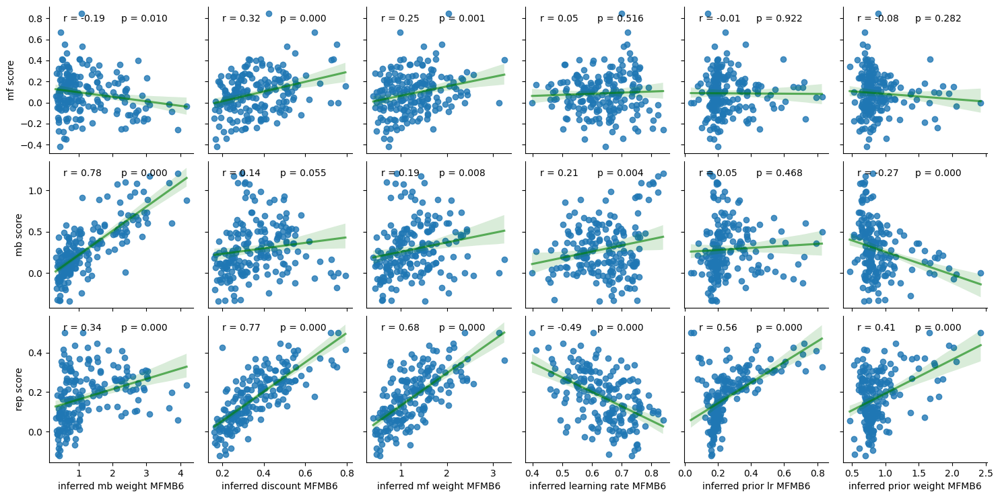

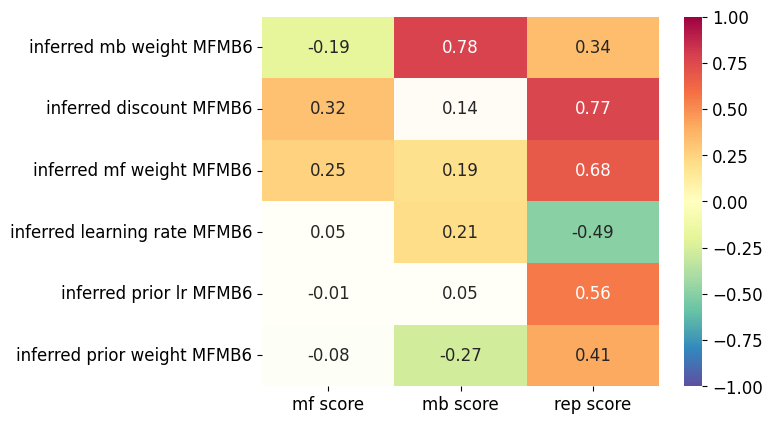

In [64]:
# MFMB6

concat_keys_MFMB6 = [name+" MFMB6" for name in MFMB6_mean_df.keys()]

new_name_dict_MFMB6 = {MFMB6_mean_df.keys()[i]: concat_keys_MFMB6[i] for i in range(len(concat_keys_MFMB6))}

renamed_MFMB6 = MFMB6_mean_df.rename(columns=new_name_dict_MFMB6)

MFMB6_scores_df = pd.concat([renamed_MFMB6, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = ["inferred "+name+" MFMB6" for name in MFMB6_param_names]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=MFMB6_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "MFMB6_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(MFMB6_scores_df, x_vars_of_interest, y_vars_of_interest)

### MFMB6 results: transform to beta  & omega, plot correlations with behavioral outputs: mf-/mb-scores

Index(['Unnamed: 0', 'inferred mb weight', 'subject', 'inferred discount',
       'inferred mf weight', 'inferred learning rate', 'inferred prior lr',
       'inferred prior weight'],
      dtype='object')
['beta MFMB6', 'omega_mb MFMB6', 'omega_mf MFMB6', 'omega_prior MFMB6']


<Figure size 640x480 with 0 Axes>

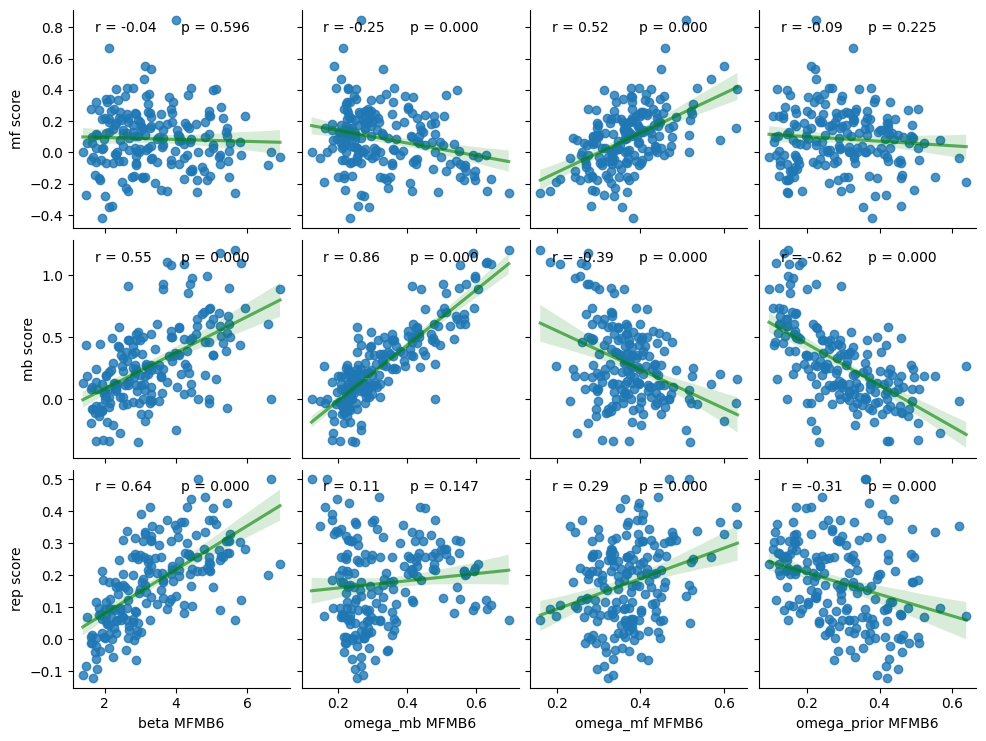

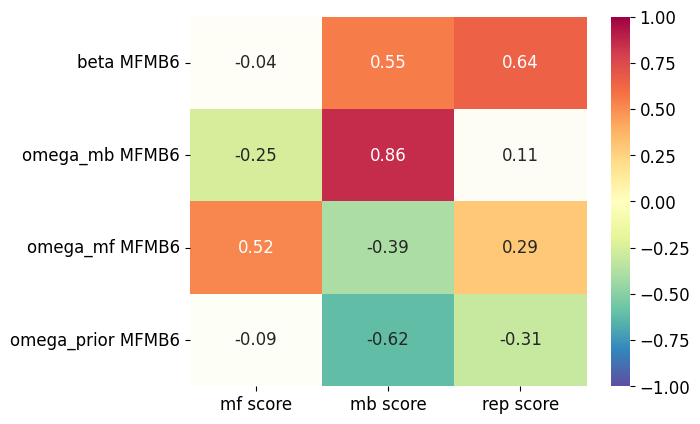

In [65]:
# BCC4 planning repetition

print(MFMB6_mean_df.keys())

beta = MFMB6_mean_df["inferred mb weight"] + MFMB6_mean_df["inferred mf weight"] + MFMB6_mean_df["inferred prior weight"]

omega1 = MFMB6_mean_df["inferred mb weight"] / beta

omega2 = MFMB6_mean_df["inferred mf weight"] / beta

omega3 = MFMB6_mean_df["inferred prior weight"] / beta

transformed_params = ["beta", "omega_mb", "omega_mf", "omega_prior"]

MFMB6_transformed_mean_df = MFMB6_mean_df.copy()

MFMB6_transformed_mean_df["beta"] = beta

MFMB6_transformed_mean_df["omega_mb"] = omega1

MFMB6_transformed_mean_df["omega_mf"] = omega2

MFMB6_transformed_mean_df["omega_prior"] = omega3

concat_keys_MFMB6 = [name+" MFMB6" for name in MFMB6_transformed_mean_df.keys()]

new_name_dict_MFMB6 = {MFMB6_transformed_mean_df.keys()[i]: concat_keys_MFMB6[i] for i in range(len(concat_keys_MFMB6))}

renamed_MFMB6 = MFMB6_transformed_mean_df.rename(columns=new_name_dict_MFMB6)

MFMB6_scores_df = pd.concat([renamed_MFMB6, scores_df], axis='columns')#, join="inner")

plt.figure()
x_vars_of_interest = [name+" MFMB6" for name in transformed_params]
print(x_vars_of_interest)
y_vars_of_interest = ["mf score", "mb score", "rep score"]
f = sns.pairplot(data=MFMB6_scores_df, kind='reg', #diag_kind="hist", corner=True,
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    x_vars=x_vars_of_interest, y_vars=y_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[2,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("BCC3 analysis 1 correlations with scores")
plt.savefig(os.path.join(results_folder, "BCC4_planning_repetition_correlations_with_scores.svg"))
plt.show()

iu.plot_correlations(MFMB6_scores_df, x_vars_of_interest, y_vars_of_interest)

### Sanity check: did the MFMB4 and MFMB6 analyses yield consistent results in the parameters they share?

Plotting correlations between inferred parameters of the two analyses

Index(['Unnamed: 0 MFMB4', 'inferred mb weight MFMB4', 'subject MFMB4',
       'inferred discount MFMB4', 'inferred mf weight MFMB4',
       'inferred learning rate MFMB4', 'Unnamed: 0 MFMB6',
       'inferred mb weight MFMB6', 'subject MFMB6', 'inferred discount MFMB6',
       'inferred mf weight MFMB6', 'inferred learning rate MFMB6',
       'inferred prior lr MFMB6', 'inferred prior weight MFMB6'],
      dtype='object')
['Unnamed: 0 MFMB4', 'inferred mb weight MFMB4', 'subject MFMB4', 'inferred discount MFMB4', 'inferred mf weight MFMB4', 'inferred learning rate MFMB4']
['Unnamed: 0 MFMB6', 'inferred mb weight MFMB6', 'subject MFMB6', 'inferred discount MFMB6', 'inferred mf weight MFMB6', 'inferred learning rate MFMB6', 'inferred prior lr MFMB6', 'inferred prior weight MFMB6']
Index(['Unnamed: 0 MFMB4', 'inferred mb weight MFMB4', 'subject MFMB4',
       'inferred discount MFMB4', 'inferred mf weight MFMB4',
       'inferred learning rate MFMB4'],
      dtype='object')


<Figure size 640x480 with 0 Axes>

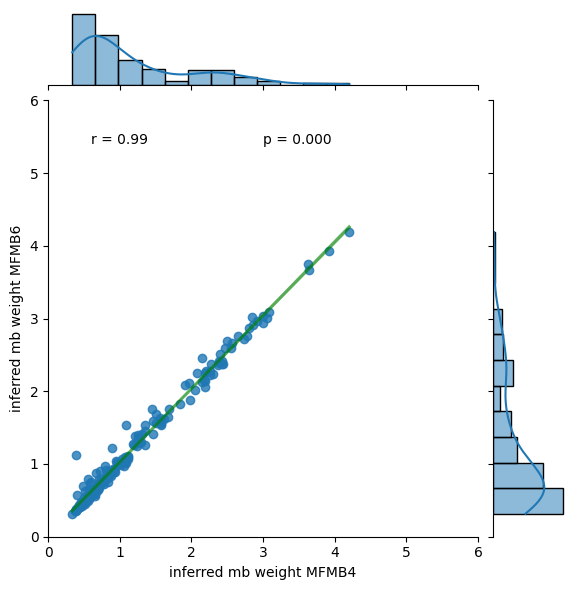

<Figure size 640x480 with 0 Axes>

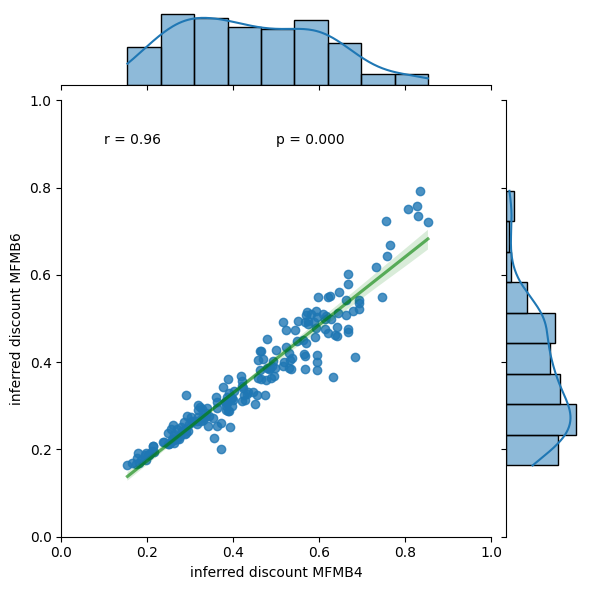

<Figure size 640x480 with 0 Axes>

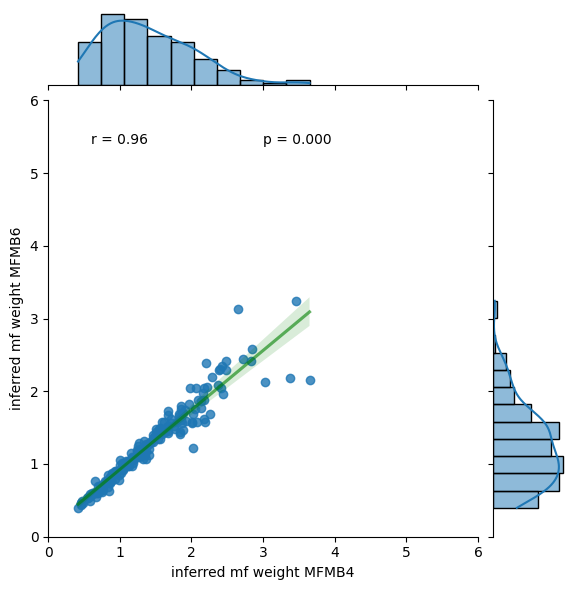

<Figure size 640x480 with 0 Axes>

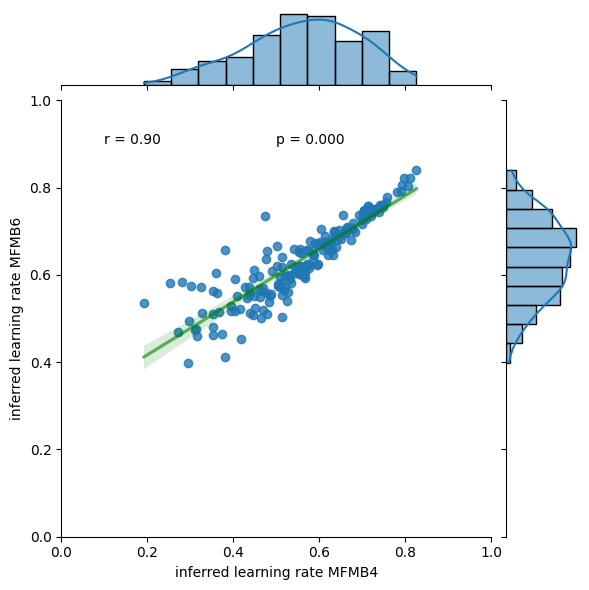

In [66]:
# compare the two results

concat_keys_MFMB4 = [name+" MFMB4" for name in MFMB4_mean_df.keys()]
concat_keys_MFMB6 = [name+" MFMB6" for name in MFMB6_mean_df.keys()]

new_name_dict_MFMB4 = {MFMB4_mean_df.keys()[i]: concat_keys_MFMB4[i] for i in range(len(concat_keys_MFMB4))}
new_name_dict_MFMB5 = {MFMB6_mean_df.keys()[i]: concat_keys_MFMB6[i] for i in range(len(concat_keys_MFMB6))}

renamed_MFMB4 = MFMB4_mean_df.rename(columns=new_name_dict_MFMB4)
renamed_MFMB5 = MFMB6_mean_df.rename(columns=new_name_dict_MFMB5)

MFMB_means_df = pd.concat([renamed_MFMB4, renamed_MFMB5], axis='columns')#, join="inner")

print(MFMB_means_df.keys())

print(concat_keys_MFMB4)
print(concat_keys_MFMB6)
print(renamed_MFMB4.keys())

for i, name in enumerate(MFMB4_param_names):
    plt.figure()
    sns.jointplot(data=MFMB_means_df, x="inferred "+name+" MFMB4", y="inferred "+name+" MFMB6", 
                  kind='reg', joint_kws={'line_kws': {'color': 'green', 'alpha': 0.6}})
    tu.annot_corrfunc(MFMB_means_df["inferred "+name+" MFMB4"], MFMB_means_df["inferred "+name+" MFMB6"])
    plt.xlim(MFMB4_param_ranges[i])
    plt.ylim(MFMB4_param_ranges[i])
    plt.show()

if False:

    MFMB4_vars_of_interest = ["inferred "+name+" MFMB4" for name in MFMB4_param_names]
    MFMB6_vars_of_interest = ["inferred "+name+" MFMB6" for name in MFMB4_param_names]

    iu.plot_correlations(MFMB_means_df, MFMB4_vars_of_interest, MFMB6_vars_of_interest)

### Compare inferences between the BCC and MFMB models:

using the BCC4 planning+repetition and the MFMB4 model for the comparison

Index(['Unnamed: 0 BCC4_p_r', 'inferred dec temp BCC4_p_r', 'subject BCC4_p_r',
       'inferred reward rate BCC4_p_r', 'inferred habitual tendency BCC4_p_r',
       'inferred policy rate BCC4_p_r', 'Unnamed: 0 MFMB4',
       'inferred mb weight MFMB4', 'subject MFMB4', 'inferred discount MFMB4',
       'inferred mf weight MFMB4', 'inferred learning rate MFMB4'],
      dtype='object')
['inferred dec temp BCC4_p_r', 'inferred reward rate BCC4_p_r', 'inferred habitual tendency BCC4_p_r', 'inferred policy rate BCC4_p_r']
['inferred mb weight MFMB4', 'inferred discount MFMB4', 'inferred mf weight MFMB4', 'inferred learning rate MFMB4']


<Figure size 640x480 with 0 Axes>

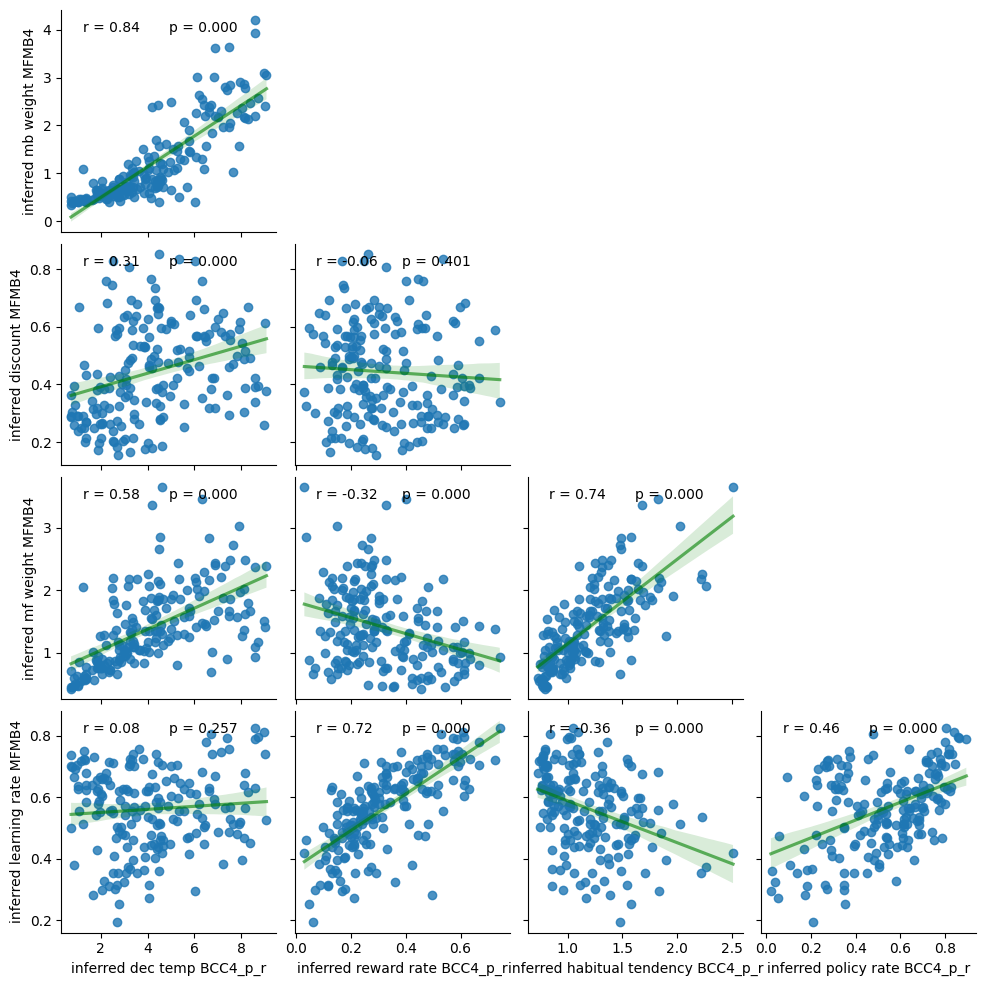

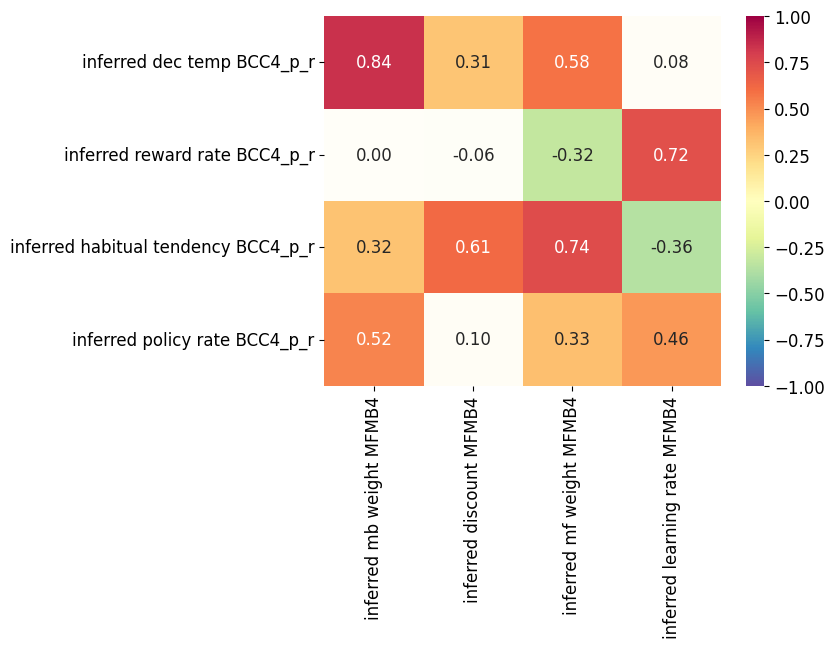

In [67]:
# compare BCC and MBMF4 results

BCC4_p_r_MBMF4_means_df = pd.concat([renamed_BCC4_p_r, renamed_MFMB4], axis='columns')#, join="inner")

print(BCC4_p_r_MBMF4_means_df.keys())

y_vars_of_interest = ["inferred "+name+" MFMB4" for name in MFMB4_param_names]
x_vars_of_interest = ["inferred "+name+" BCC4_p_r" for name in BCC4_p_r_param_names]

print(x_vars_of_interest)
print(y_vars_of_interest)

plt.figure()
f = sns.pairplot(data=BCC4_p_r_MBMF4_means_df, kind='reg', corner=True,#, diag_kind="hist"
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    y_vars=y_vars_of_interest,
                    x_vars=x_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[3,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("MFMB5 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()

iu.plot_correlations(BCC4_p_r_MBMF4_means_df, x_vars_of_interest, y_vars_of_interest)

using the BCC4 planning+cached and the MFMB4 model for the comparison

Index(['Unnamed: 0 BCC4_p_c', 'inferred dec temp BCC4_p_c', 'subject BCC4_p_c',
       'inferred reward rate BCC4_p_c', 'inferred cached weight BCC4_p_c',
       'inferred cached rate BCC4_p_c', 'Unnamed: 0 MFMB4',
       'inferred mb weight MFMB4', 'subject MFMB4', 'inferred discount MFMB4',
       'inferred mf weight MFMB4', 'inferred learning rate MFMB4'],
      dtype='object')
['inferred dec temp BCC4_p_c', 'inferred reward rate BCC4_p_c', 'inferred cached weight BCC4_p_c', 'inferred cached rate BCC4_p_c']
['inferred mb weight MFMB4', 'inferred discount MFMB4', 'inferred mf weight MFMB4', 'inferred learning rate MFMB4']


<Figure size 640x480 with 0 Axes>

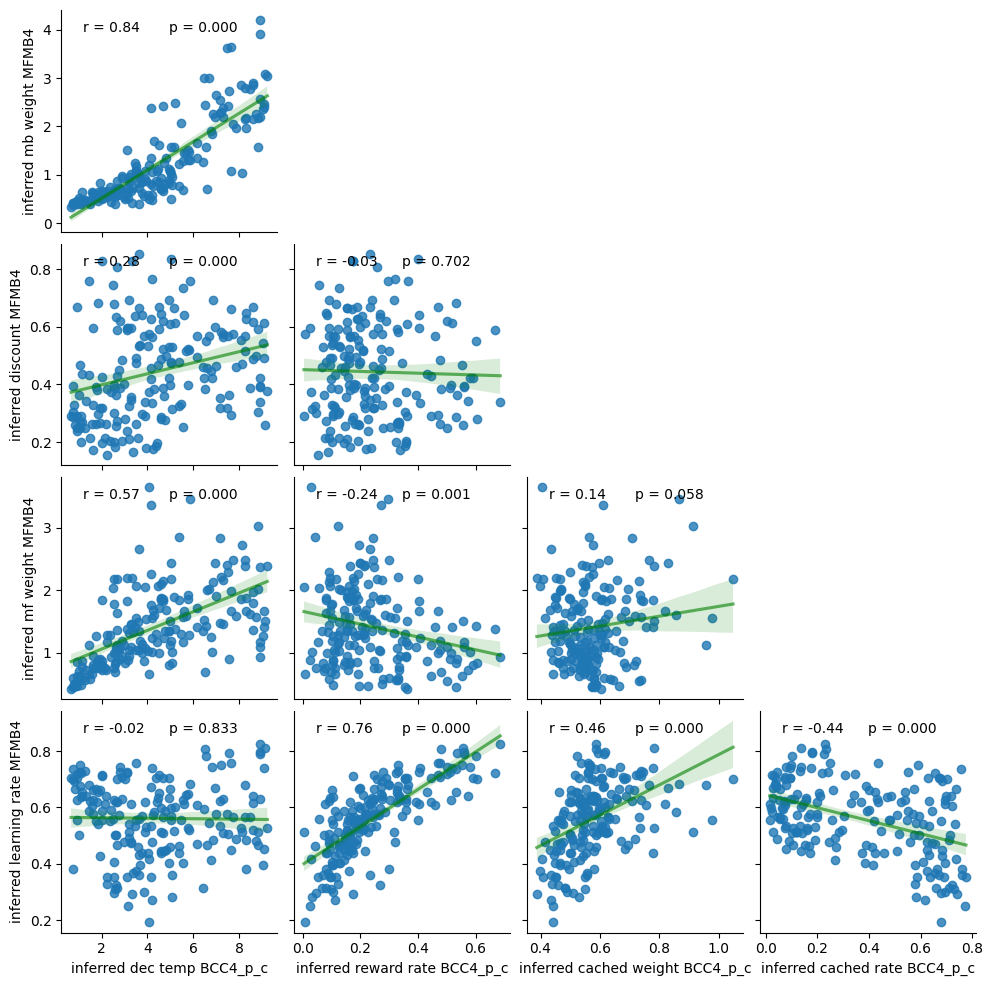

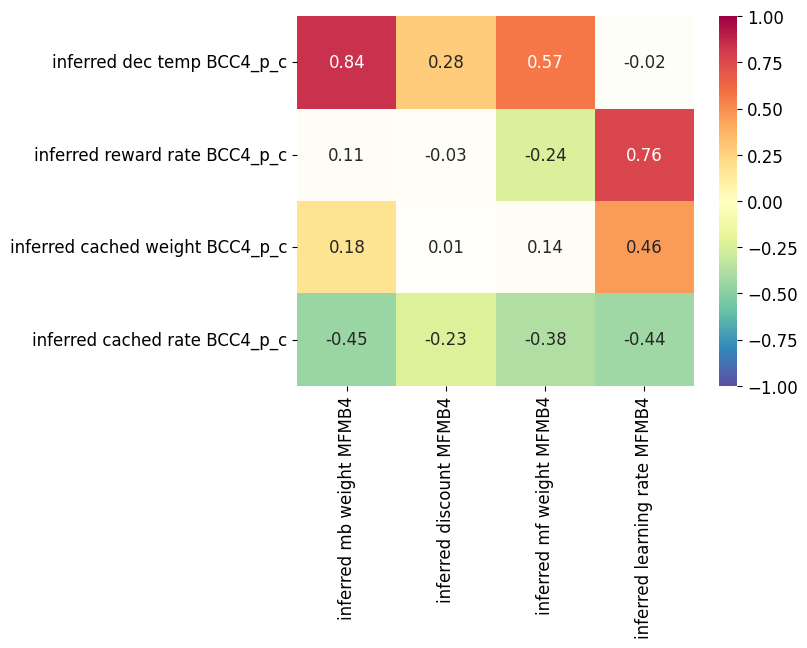

In [68]:
# compare BCC and MBMF4 results

BCC4_p_c_MBMF4_means_df = pd.concat([renamed_BCC4_p_c, renamed_MFMB4], axis='columns')#, join="inner")

print(BCC4_p_c_MBMF4_means_df.keys())

y_vars_of_interest = ["inferred "+name+" MFMB4" for name in MFMB4_param_names]
x_vars_of_interest = ["inferred "+name+" BCC4_p_c" for name in BCC4_p_c_param_names]

print(x_vars_of_interest)
print(y_vars_of_interest)

plt.figure()
f = sns.pairplot(data=BCC4_p_c_MBMF4_means_df, kind='reg', corner=True,#, diag_kind="hist"
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    y_vars=y_vars_of_interest,
                    x_vars=x_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[3,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("MFMB5 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()
        

iu.plot_correlations(BCC4_p_c_MBMF4_means_df, x_vars_of_interest, y_vars_of_interest)

using the BCC6 planning+cached and the MFMB4 model for the comparison

Index(['Unnamed: 0 BCC6', 'inferred dec temp BCC6', 'subject BCC6',
       'inferred reward rate BCC6', 'inferred habitual tendency BCC6',
       'inferred policy rate BCC6', 'inferred cached weight BCC6',
       'inferred cached rate BCC6', 'Unnamed: 0 MFMB4',
       'inferred mb weight MFMB4', 'subject MFMB4', 'inferred discount MFMB4',
       'inferred mf weight MFMB4', 'inferred learning rate MFMB4'],
      dtype='object')
['inferred dec temp BCC6', 'inferred reward rate BCC6', 'inferred habitual tendency BCC6', 'inferred policy rate BCC6', 'inferred cached weight BCC6', 'inferred cached rate BCC6']
['inferred mb weight MFMB4', 'inferred discount MFMB4', 'inferred mf weight MFMB4', 'inferred learning rate MFMB4']


<Figure size 640x480 with 0 Axes>

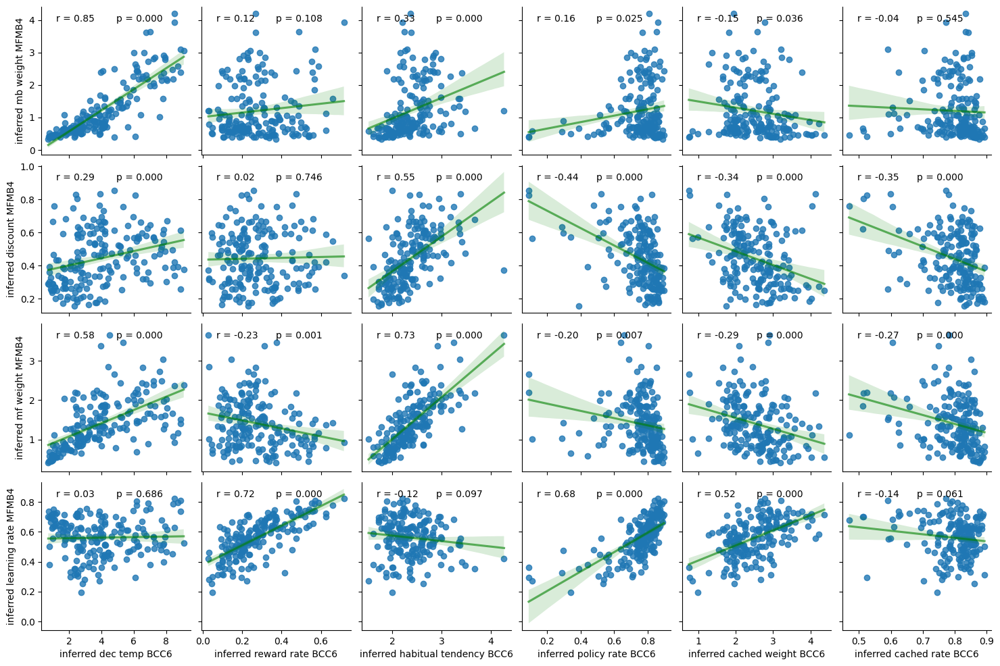

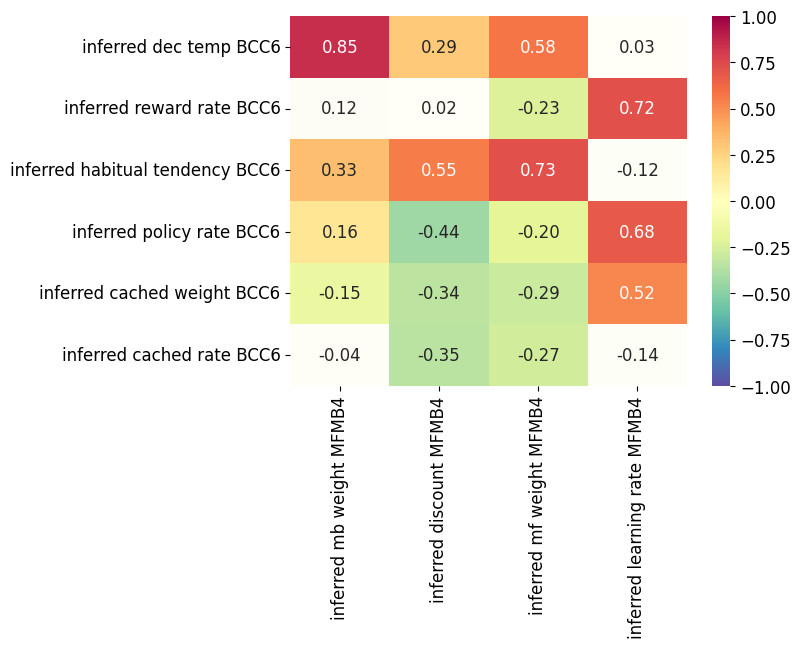

In [69]:
# compare BCC and MBMF4 results

BCC6_MBMF4_means_df = pd.concat([renamed_BCC6, renamed_MFMB4], axis='columns')#, join="inner")

print(BCC6_MBMF4_means_df.keys())

y_vars_of_interest = ["inferred "+name+" MFMB4" for name in MFMB4_param_names]
x_vars_of_interest = ["inferred "+name+" BCC6" for name in BCC6_param_names]

print(x_vars_of_interest)
print(y_vars_of_interest)

plt.figure()
f = sns.pairplot(data=BCC6_MBMF4_means_df, kind='reg',# corner=True,#, diag_kind="hist"
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    y_vars=y_vars_of_interest,
                    x_vars=x_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[3,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("MFMB5 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()
        
iu.plot_correlations(BCC6_MBMF4_means_df, x_vars_of_interest, y_vars_of_interest)

### Compare inferences between the BCC and MFMB models:

using the BCC4 planning+repetition and the MFMB6 model for the comparison

Index(['Unnamed: 0 BCC4_p_r', 'inferred dec temp BCC4_p_r', 'subject BCC4_p_r',
       'inferred reward rate BCC4_p_r', 'inferred habitual tendency BCC4_p_r',
       'inferred policy rate BCC4_p_r', 'Unnamed: 0 MFMB6',
       'inferred mb weight MFMB6', 'subject MFMB6', 'inferred discount MFMB6',
       'inferred mf weight MFMB6', 'inferred learning rate MFMB6',
       'inferred prior lr MFMB6', 'inferred prior weight MFMB6', 'beta MFMB6',
       'omega_mb MFMB6', 'omega_mf MFMB6', 'omega_prior MFMB6'],
      dtype='object')
['inferred dec temp BCC4_p_r', 'inferred reward rate BCC4_p_r', 'inferred habitual tendency BCC4_p_r', 'inferred policy rate BCC4_p_r']
['inferred mb weight MFMB6', 'inferred discount MFMB6', 'inferred mf weight MFMB6', 'inferred learning rate MFMB6', 'inferred prior lr MFMB6', 'inferred prior weight MFMB6']


<Figure size 640x480 with 0 Axes>

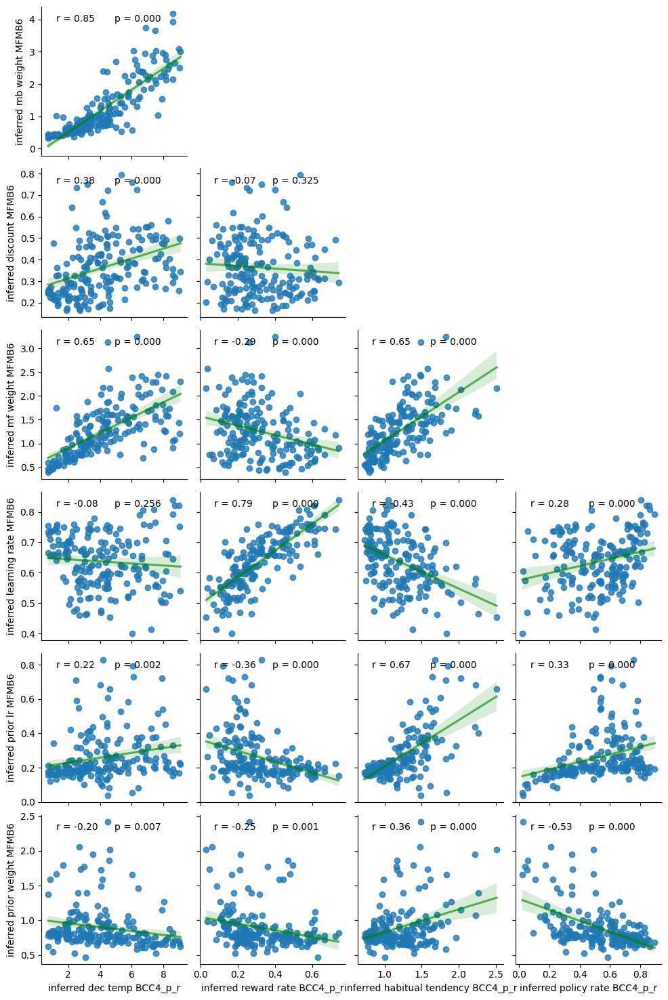

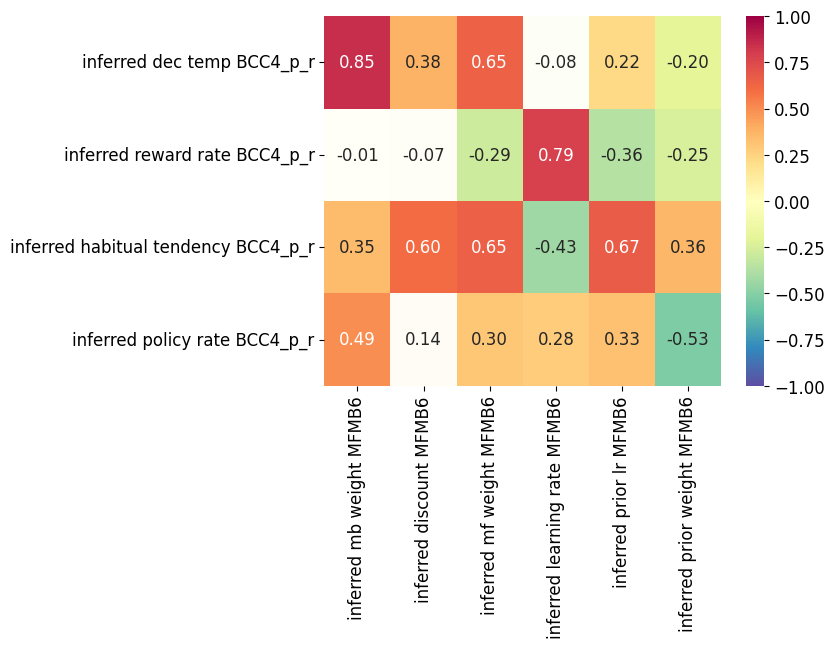

In [70]:
# compare BCC and MBMF4 results

BCC4_p_r_MBMF6_means_df = pd.concat([renamed_BCC4_p_r, renamed_MFMB6], axis='columns')#, join="inner")

print(BCC4_p_r_MBMF6_means_df.keys())

y_vars_of_interest = ["inferred "+name+" MFMB6" for name in MFMB6_param_names]
x_vars_of_interest = ["inferred "+name+" BCC4_p_r" for name in BCC4_p_r_param_names]

print(x_vars_of_interest)
print(y_vars_of_interest)

plt.figure()
f = sns.pairplot(data=BCC4_p_r_MBMF6_means_df, kind='reg', corner=True,#, diag_kind="hist"
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    y_vars=y_vars_of_interest,
                    x_vars=x_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[3,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("MFMB5 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()
        
iu.plot_correlations(BCC4_p_r_MBMF6_means_df, x_vars_of_interest, y_vars_of_interest)

using the BCC4 planning+cached and the MFMB6 model for the comparison

Index(['Unnamed: 0 BCC4_p_c', 'inferred dec temp BCC4_p_c', 'subject BCC4_p_c',
       'inferred reward rate BCC4_p_c', 'inferred cached weight BCC4_p_c',
       'inferred cached rate BCC4_p_c', 'Unnamed: 0 MFMB6',
       'inferred mb weight MFMB6', 'subject MFMB6', 'inferred discount MFMB6',
       'inferred mf weight MFMB6', 'inferred learning rate MFMB6',
       'inferred prior lr MFMB6', 'inferred prior weight MFMB6', 'beta MFMB6',
       'omega_mb MFMB6', 'omega_mf MFMB6', 'omega_prior MFMB6'],
      dtype='object')
['inferred dec temp BCC4_p_c', 'inferred reward rate BCC4_p_c', 'inferred cached weight BCC4_p_c', 'inferred cached rate BCC4_p_c']
['inferred mb weight MFMB6', 'inferred discount MFMB6', 'inferred mf weight MFMB6', 'inferred learning rate MFMB6', 'inferred prior lr MFMB6', 'inferred prior weight MFMB6']


<Figure size 640x480 with 0 Axes>

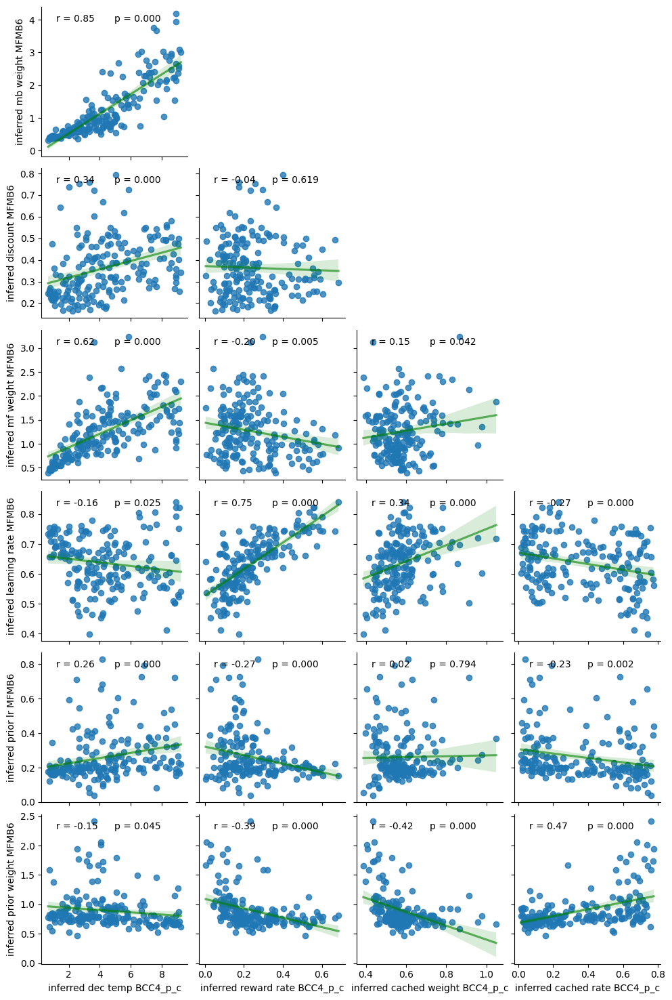

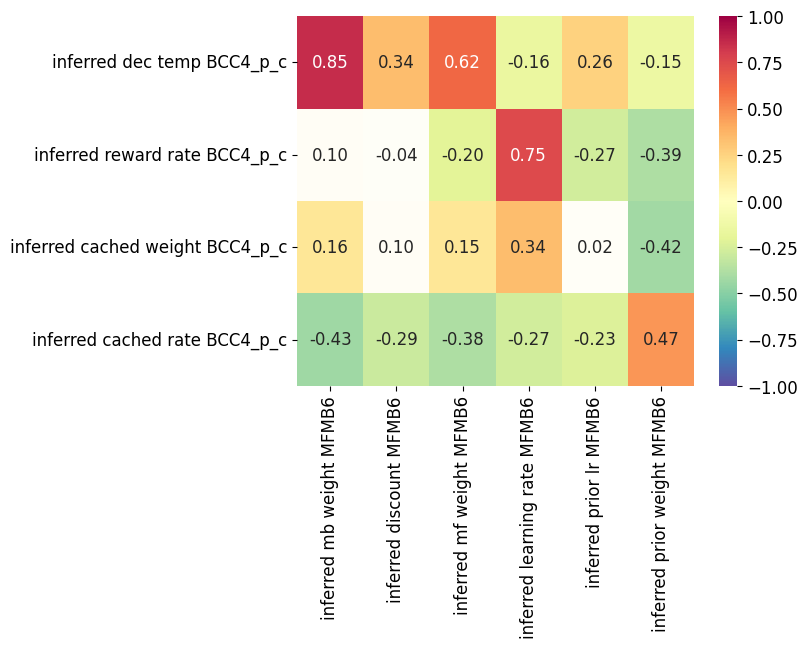

In [71]:
# compare BCC and MBMF4 results

BCC4_p_c_MBMF6_means_df = pd.concat([renamed_BCC4_p_c, renamed_MFMB6], axis='columns')#, join="inner")

print(BCC4_p_c_MBMF6_means_df.keys())

y_vars_of_interest = ["inferred "+name+" MFMB6" for name in MFMB6_param_names]
x_vars_of_interest = ["inferred "+name+" BCC4_p_c" for name in BCC4_p_c_param_names]

print(x_vars_of_interest)
print(y_vars_of_interest)

plt.figure()
f = sns.pairplot(data=BCC4_p_c_MBMF6_means_df, kind='reg', corner=True,#, diag_kind="hist"
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    y_vars=y_vars_of_interest,
                    x_vars=x_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[3,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("MFMB5 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()
        
iu.plot_correlations(BCC4_p_c_MBMF6_means_df, x_vars_of_interest, y_vars_of_interest)

using the BCC6 planning+cached and the MFMB6 model for the comparison

Index(['Unnamed: 0 BCC6', 'inferred dec temp BCC6', 'subject BCC6',
       'inferred reward rate BCC6', 'inferred habitual tendency BCC6',
       'inferred policy rate BCC6', 'inferred cached weight BCC6',
       'inferred cached rate BCC6', 'Unnamed: 0 MFMB6',
       'inferred mb weight MFMB6', 'subject MFMB6', 'inferred discount MFMB6',
       'inferred mf weight MFMB6', 'inferred learning rate MFMB6',
       'inferred prior lr MFMB6', 'inferred prior weight MFMB6', 'beta MFMB6',
       'omega_mb MFMB6', 'omega_mf MFMB6', 'omega_prior MFMB6'],
      dtype='object')
['inferred dec temp BCC6', 'inferred reward rate BCC6', 'inferred habitual tendency BCC6', 'inferred policy rate BCC6', 'inferred cached weight BCC6', 'inferred cached rate BCC6']
['inferred mb weight MFMB6', 'inferred discount MFMB6', 'inferred mf weight MFMB6', 'inferred learning rate MFMB6', 'inferred prior lr MFMB6', 'inferred prior weight MFMB6']


<Figure size 640x480 with 0 Axes>

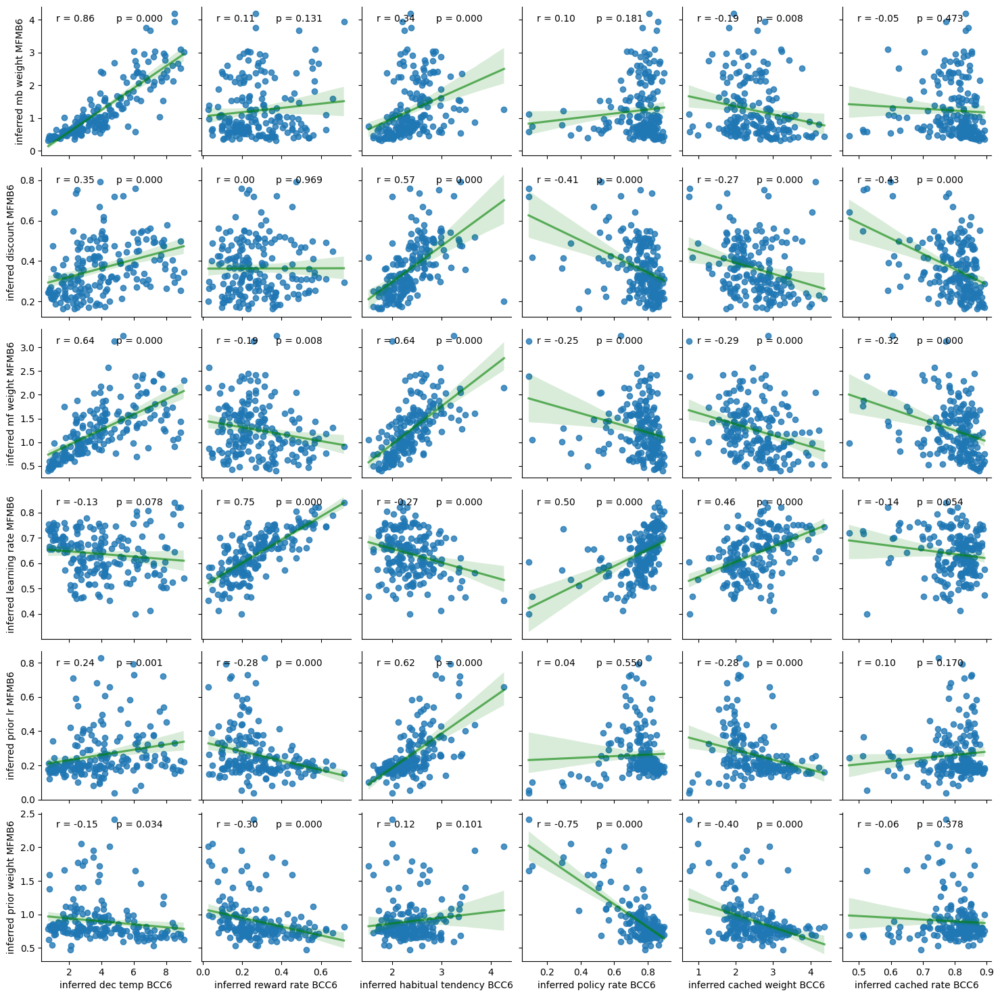

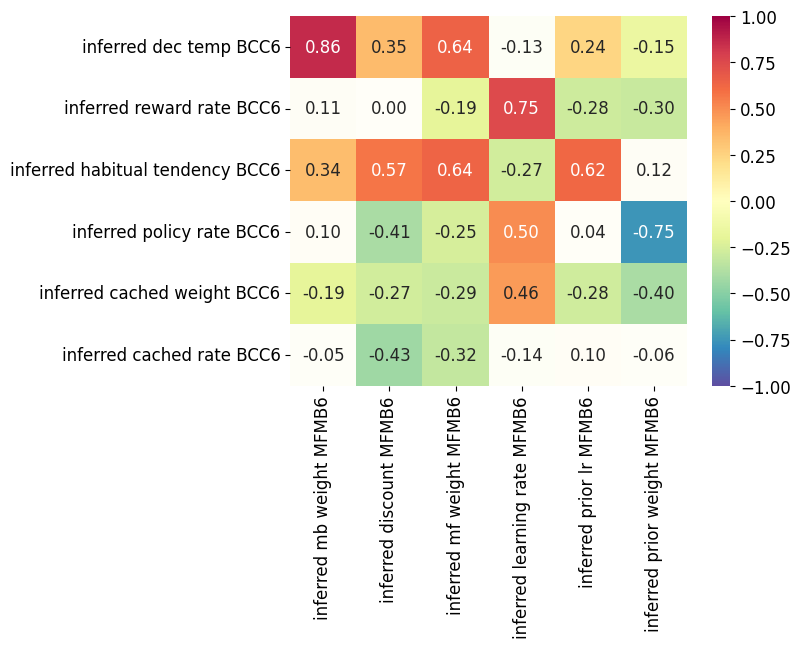

In [72]:
# compare BCC and MBMF6 results

BCC6_MBMF6_means_df = pd.concat([renamed_BCC6, renamed_MFMB6], axis='columns')#, join="inner")

print(BCC6_MBMF6_means_df.keys())

y_vars_of_interest = ["inferred "+name+" MFMB6" for name in MFMB6_param_names]
x_vars_of_interest = ["inferred "+name+" BCC6" for name in BCC6_param_names]

print(x_vars_of_interest)
print(y_vars_of_interest)

plt.figure()
f = sns.pairplot(data=BCC6_MBMF6_means_df, kind='reg',# corner=True,#, diag_kind="hist"
                    plot_kws={'line_kws': {'color': 'green', 'alpha': 0.6}},
                    y_vars=y_vars_of_interest,
                    x_vars=x_vars_of_interest)
f.map(tu.annot_corrfunc)
#for p, p_range in enumerate(param_plot_ranges):
#    f.axes[3,p].set_xlim(p_range)
#    f.axes[p,0].set_ylim(p_range)
#plt.title("MFMB5 analysis")
#plt.savefig(os.path.join(base_dir, fname_str+"_pairplot_means_inferred_corr.svg"))
plt.show()

iu.plot_correlations(BCC6_MBMF6_means_df, x_vars_of_interest, y_vars_of_interest)